In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.metrics.pairwise import haversine_distances
import numpy as np
pd.set_option('display.max_columns', None)
import seaborn as sns
import plotly.express as px
import folium
from folium.plugins import MarkerCluster
from kmodes.kmodes import KModes
from sklearn.preprocessing import OrdinalEncoder
from scipy.spatial.distance import cdist
from sklearn.metrics import jaccard_score
from scipy.stats import chi2_contingency

## Importar base de dados

In [2]:
data = pd.read_excel("acidentes-2023.xlsx",sheet_name="30dias_acV", skiprows=1, usecols="B:AT",na_values=["NA", "NÃO DEFINIDO"], engine="openpyxl")

In [3]:
data.head(10)

,Id. Acidente,Datahora,Ano,Mês,Dia,Hora,Entidades Fiscalizadoras,Velocidade geral,Velocidade local,Dia da Semana,Latitude GPS,Longitude GPS,Num. Mortos a 30 dias SUM,Num. Feridos graves a 30 dias SUM,Num. Feridos ligeiros a 30 dias SUM,Características Tecnicas1,Cond Aderência,Distrito,Concelho,Freguesia,Nome arruamento,Tipos Vias,Cod Via,Nome Outra Via,Km,Desc. Esquema,Estado Conservação,Factores Atmosféricos,Reg Circulação1,Intersecção Vias,Localizações,Luminosidade,Marca Via,Natureza,Obras Arte,Obstáculos,Sentidos,Sinais,Sinais Luminosos,Tipo Piso,Traçado 1,Traçado 2,Traçado 3,Traçado 4,Via Trânsito
0,20232550299,2023:01:01 00:08:00,2023,Jan,1900-01-01 00:00:00,00:08:00,Guarda Nacional Republicana,50,30,Domingo,37.022080,-8.928065,0,1,0,Estrada sem separador,Seco e limpo,Faro,Vila do Bispo,Sagres,Rua Baiona la Real - Martinhal,Arruamento,0,NaN,NaN,"Acid. só c/ 1 veíc. s/ obst., animais, etc. - D5",Em bom estado,Bom tempo,Dois sentidos,Fora da intersecção,Dentro das localidades,"Noite, com iluminação",Sem marcas rodoviárias ou pouco visíveis,Despiste simples,NaN,Inexistentes,NaN,NaN,A funcionar normalmente,Betuminoso,Recta,Em patamar,Sem berma ou impraticável,Em plena via,Direita
1,20232541099,2023:01:01 00:30:00,2023,Jan,1900-01-01 00:00:00,00:30:00,Polícia de Segurança Pública,50,50,Domingo,32.839625,-17.194881,0,0,3,Estrada sem separador,Seco e limpo,Ilha da Madeira,Porto Moniz,Achadas da Cruz,NaN,ER - Estrada Regional,ER101,NaN,7.9,"Acid. só c/ 1 veíc. s/ obst., animais, etc. - D2",Em bom estado,Bom tempo,Dois sentidos,Fora da intersecção,Dentro das localidades,"Noite, sem iluminação",Com marcas - separadoras de sentido e de vias ...,Despiste sem dispositivo de retenção,NaN,Inexistentes,NaN,Outros,Inexistentes,Betuminoso,Curva,Com inclinação,Sem berma ou impraticável,Em plena via,Direita
2,20232544763,2023:01:01 00:50:00,2023,Jan,1900-01-01 00:00:00,00:50:00,Polícia de Segurança Pública,80,80,Domingo,38.680644,-28.197208,0,0,1,Estrada sem separador,Molhado,Ilha de São Jorge,Velas,Santo Amaro (R.A.Açores),NaN,ER - Estrada Regional,0,NaN,NaN,"Acid. só c/ 1 veíc. e obst., animais, etc. - C5",Em estado regular,Granizo,Dois sentidos,Fora da intersecção,Fora das localidades,"Noite, sem iluminação",Sem marcas rodoviárias ou pouco visíveis,Despiste com colisão com veículo imobil. ou ob...,NaN,Inexistentes,NaN,NaN,Inexistentes,Betuminoso,Recta,Com inclinação,Sem berma ou impraticável,Na berma,Direita
3,20232544243,2023:01:01 01:00:00,2023,Jan,1900-01-01 00:00:00,01:00:00,Guarda Nacional Republicana,90,90,Domingo,41.252840,-7.283369,0,0,1,Estrada sem separador,Molhado,Bragança,Carrazeda de Ansiaes,Carrazeda de Ansiães,NaN,EN - Estrada Nacional,EN214,NaN,21.0,"Acid. só c/ 1 veíc. s/ obst., animais, etc. - D6",Em estado regular,Chuva,Dois sentidos,Fora da intersecção,Fora das localidades,"Noite, com iluminação",Com marcas - separadoras de sentido de trânsito,Despiste com capotamento,NaN,Inexistentes,NaN,NaN,Inexistentes,Betuminoso,Recta,Em patamar,Sem berma ou impraticável,Na berma,Direita
4,20232548032,2023:01:01 01:15:00,2023,Jan,1900-01-01 00:00:00,01:15:00,Polícia de Segurança Pública,50,50,Domingo,41.153743,-8.650463,0,0,1,Outra via,Molhado,Porto,Porto,União das freguesias de Lordelo do Ouro e Mass...,Rua Diogo Botelho ...,Arruamento,0,NaN,NaN,Acid. c/ peões - A2,Em bom estado,Chuva,Sentido único,Fora da intersecção,Dentro das localidades,"Noite, com iluminação",Com marcas - separadoras de sentido e de vias ...,Atropelamento de peões,NaN,Inexistentes,No sentido crescente da quilometragem,Outros,A funcionar normalmente,Betuminoso,Recta,Com inclinação,Sem berma ou impraticável,Em plena via,Direita
5,20232553061,2023:01:01 01:30:00,2023,Jan,1900-01-01 00:00:00,01:30:00,Guarda Nacional Republicana,50,50,Domingo,39.181860,-8.778763,0,2,0,Estrada sem separador,Seco e limpo,Santarém,Cartaxo,Vila Chã de Ourique,Rua professor Jaime Soares Da Costa,Arruamento,0,NaN,NaN,"Acid. só c/ 1 veíc. s/ obst., animais, etc. - D6",Em bom estado,Bom t

In [4]:
data.shape

(36595, 45)

In [5]:
len(data["Id. Acidente"].unique())

36595

## Verificação dos dados

#### Valores omissos

In [6]:
data.isna().sum()

Id. Acidente                               0
Datahora                                   0
Ano                                        0
Mês                                        0
Dia                                        0
Hora                                       0
Entidades Fiscalizadoras                   0
Velocidade geral                           0
Velocidade local                           0
Dia da Semana                              0
Latitude GPS                               0
Longitude GPS                              0
Num. Mortos a 30 dias SUM                  0
Num. Feridos graves a 30 dias SUM          0
Num. Feridos ligeiros a 30 dias SUM        0
Características Tecnicas1                 10
Cond Aderência                            32
Distrito                                   0
Concelho                                   0
Freguesia                                  0
Nome arruamento                        13605
Tipos Vias                                 0
Cod Via   

In [7]:
((data.isna().sum())/36595)*100

Id. Acidente                            0.000000
Datahora                                0.000000
Ano                                     0.000000
Mês                                     0.000000
Dia                                     0.000000
Hora                                    0.000000
Entidades Fiscalizadoras                0.000000
Velocidade geral                        0.000000
Velocidade local                        0.000000
Dia da Semana                           0.000000
Latitude GPS                            0.000000
Longitude GPS                           0.000000
Num. Mortos a 30 dias SUM               0.000000
Num. Feridos graves a 30 dias SUM       0.000000
Num. Feridos ligeiros a 30 dias SUM     0.000000
Características Tecnicas1               0.027326
Cond Aderência                          0.087444
Distrito                                0.000000
Concelho                                0.000000
Freguesia                               0.000000
Nome arruamento     

#### Tipos de dados

In [8]:
data.dtypes

Id. Acidente                             int64
Datahora                                object
Ano                                      int64
Mês                                     object
Dia                                     object
Hora                                    object
Entidades Fiscalizadoras                object
Velocidade geral                         int64
Velocidade local                         int64
Dia da Semana                           object
Latitude GPS                           float64
Longitude GPS                          float64
Num. Mortos a 30 dias SUM                int64
Num. Feridos graves a 30 dias SUM        int64
Num. Feridos ligeiros a 30 dias SUM      int64
Características Tecnicas1               object
Cond Aderência                          object
Distrito                                object
Concelho                                object
Freguesia                               object
Nome arruamento                         object
Tipos Vias   

In [9]:
variaveis = ['Mês', 'Entidades Fiscalizadoras',
       'Dia da Semana', 'Características Tecnicas1', 'Cond Aderência',
       'Distrito', 'Tipos Vias', 'Estado Conservação',
       'Factores Atmosféricos', 'Reg Circulação1', 'Intersecção Vias',
       'Localizações', 'Luminosidade', 'Marca Via', 'Natureza', 'Obras Arte',
       'Obstáculos', 'Sentidos', 'Sinais', 'Sinais Luminosos', 'Tipo Piso',
       'Traçado 1', 'Traçado 2', 'Traçado 3', 'Traçado 4', 'Via Trânsito','Velocidade geral','Velocidade local']
for i in variaveis:
    print(i)
    print(data[i].unique())
    print()

Mês
['Jan' 'Fev' 'Mar' 'Abr' 'Mai' 'Jun' 'Jul' 'Ago' 'Set' 'Out' 'Nov' 'Dez']

Entidades Fiscalizadoras
['Guarda Nacional Republicana' 'Polícia de Segurança Pública']

Dia da Semana
['Domingo      ' 'Segunda-Feira' 'Terça-Feira  ' 'Quarta-Feira '
 'Quinta-Feira ' 'Sexta-Feira  ' 'Sábado       ']

Características Tecnicas1
['Estrada sem separador' 'Outra via' 'Auto-estrada' nan]

Cond Aderência
['Seco e limpo' 'Molhado' 'Húmido'
 'Com água acumulada na faixa de rodagem' 'Com lama'
 'Com gelo, geada ou neve' 'Com gravilha ou areia' 'Com óleo' nan]

Distrito
['Faro' 'Ilha da Madeira' 'Ilha de São Jorge' 'Bragança' 'Porto'
 'Santarém' 'Viseu' 'Lisboa' 'Aveiro' 'Beja' 'Portalegre'
 'Viana do Castelo' 'Setúbal' 'Castelo Branco' 'Guarda' 'Braga' 'Leiria'
 'Coimbra' 'Vila Real' 'Évora' 'Ilha Terceira' 'Ilha das Flores'
 'Ilha do Faial' 'Ilha de São Miguel' 'Ilha do Pico' 'Ilha de Porto Santo'
 'Ilha de Santa Maria' 'Ilha da Graciosa']

Tipos Vias
['Arruamento' 'ER - Estrada Regional' 'EN - Est

In [10]:
data[["Latitude GPS", "Longitude GPS", "Num. Mortos a 30 dias SUM", "Num. Feridos graves a 30 dias SUM", "Num. Feridos ligeiros a 30 dias SUM"]].describe()

,Latitude GPS,Longitude GPS,Num. Mortos a 30 dias SUM,Num. Feridos graves a 30 dias SUM,Num. Feridos ligeiros a 30 dias SUM
count,36595.000000,36595.000000,36595.000000,36595.000000,36595.000000
mean,39.679755,-9.106252,0.016040,0.069682,1.171690
std,1.772412,2.708272,0.135672,0.283845,0.682271
min,32.634256,-31.208974,0.000000,0.000000,0.000000
25%,38.728996,-9.103982,0.000000,0.000000,1.000000
50%,39.838250,-8.617177,0.000000,0.000000,1.000000
75%,41.165802,-8.347951,0.000000,0.000000,1.000000
max,42.142650,-6.267464,3.000000,5.000000,11.000000


## Limpeza, Tratamento e Criação de variáveis

#### Corrigir espaçamento

In [11]:
data.loc[:,"Dia da Semana"] = data["Dia da Semana"].apply(lambda x: x.strip())

In [12]:
data["Dia da Semana"].unique()

array(['Domingo', 'Segunda-Feira', 'Terça-Feira', 'Quarta-Feira',
       'Quinta-Feira', 'Sexta-Feira', 'Sábado'], dtype=object)

#### Criação de variável 'Hora'

In [13]:
data.head()

,Id. Acidente,Datahora,Ano,Mês,Dia,Hora,Entidades Fiscalizadoras,Velocidade geral,Velocidade local,Dia da Semana,Latitude GPS,Longitude GPS,Num. Mortos a 30 dias SUM,Num. Feridos graves a 30 dias SUM,Num. Feridos ligeiros a 30 dias SUM,Características Tecnicas1,Cond Aderência,Distrito,Concelho,Freguesia,Nome arruamento,Tipos Vias,Cod Via,Nome Outra Via,Km,Desc. Esquema,Estado Conservação,Factores Atmosféricos,Reg Circulação1,Intersecção Vias,Localizações,Luminosidade,Marca Via,Natureza,Obras Arte,Obstáculos,Sentidos,Sinais,Sinais Luminosos,Tipo Piso,Traçado 1,Traçado 2,Traçado 3,Traçado 4,Via Trânsito
0,20232550299,2023:01:01 00:08:00,2023,Jan,1900-01-01 00:00:00,00:08:00,Guarda Nacional Republicana,50,30,Domingo,37.022080,-8.928065,0,1,0,Estrada sem separador,Seco e limpo,Faro,Vila do Bispo,Sagres,Rua Baiona la Real - Martinhal,Arruamento,0,NaN,NaN,"Acid. só c/ 1 veíc. s/ obst., animais, etc. - D5",Em bom estado,Bom tempo,Dois sentidos,Fora da intersecção,Dentro das localidades,"Noite, com iluminação",Sem marcas rodoviárias ou pouco visíveis,Despiste simples,NaN,Inexistentes,NaN,NaN,A funcionar normalmente,Betuminoso,Recta,Em patamar,Sem berma ou impraticável,Em plena via,Direita
1,20232541099,2023:01:01 00:30:00,2023,Jan,1900-01-01 00:00:00,00:30:00,Polícia de Segurança Pública,50,50,Domingo,32.839625,-17.194881,0,0,3,Estrada sem separador,Seco e limpo,Ilha da Madeira,Porto Moniz,Achadas da Cruz,NaN,ER - Estrada Regional,ER101,NaN,7.9,"Acid. só c/ 1 veíc. s/ obst., animais, etc. - D2",Em bom estado,Bom tempo,Dois sentidos,Fora da intersecção,Dentro das localidades,"Noite, sem iluminação",Com marcas - separadoras de sentido e de vias ...,Despiste sem dispositivo de retenção,NaN,Inexistentes,NaN,Outros,Inexistentes,Betuminoso,Curva,Com inclinação,Sem berma ou impraticável,Em plena via,Direita
2,20232544763,2023:01:01 00:50:00,2023,Jan,1900-01-01 00:00:00,00:50:00,Polícia de Segurança Pública,80,80,Domingo,38.680644,-28.197208,0,0,1,Estrada sem separador,Molhado,Ilha de São Jorge,Velas,Santo Amaro (R.A.Açores),NaN,ER - Estrada Regional,0,NaN,NaN,"Acid. só c/ 1 veíc. e obst., animais, etc. - C5",Em estado regular,Granizo,Dois sentidos,Fora da intersecção,Fora das localidades,"Noite, sem iluminação",Sem marcas rodoviárias ou pouco visíveis,Despiste com colisão com veículo imobil. ou ob...,NaN,Inexistentes,NaN,NaN,Inexistentes,Betuminoso,Recta,Com inclinação,Sem berma ou impraticável,Na berma,Direita
3,20232544243,2023:01:01 01:00:00,2023,Jan,1900-01-01 00:00:00,01:00:00,Guarda Nacional Republicana,90,90,Domingo,41.252840,-7.283369,0,0,1,Estrada sem separador,Molhado,Bragança,Carrazeda de Ansiaes,Carrazeda de Ansiães,NaN,EN - Estrada Nacional,EN214,NaN,21.0,"Acid. só c/ 1 veíc. s/ obst., animais, etc. - D6",Em estado regular,Chuva,Dois sentidos,Fora da intersecção,Fora das localidades,"Noite, com iluminação",Com marcas - separadoras de sentido de trânsito,Despiste com capotamento,NaN,Inexistentes,NaN,NaN,Inexistentes,Betuminoso,Recta,Em patamar,Sem berma ou impraticável,Na berma,Direita
4,20232548032,2023:01:01 01:15:00,2023,Jan,1900-01-01 00:00:00,01:15:00,Polícia de Segurança Pública,50,50,Domingo,41.153743,-8.650463,0,0,1,Outra via,Molhado,Porto,Porto,União das freguesias de Lordelo do Ouro e Mass...,Rua Diogo Botelho ...,Arruamento,0,NaN,NaN,Acid. c/ peões - A2,Em bom estado,Chuva,Sentido único,Fora da intersecção,Dentro das localidades,"Noite, com iluminação",Com marcas - separadoras de sentido e de vias ...,Atropelamento de peões,NaN,Inexistentes,No sentido crescente da quilometragem,Outros,A funcionar normalmente,Betuminoso,Recta,Com inclinação,Sem berma ou impraticável,Em plena via,Direita


In [14]:
data['Datahora'] = pd.to_datetime(data['Datahora'], format='%Y:%m:%d %H:%M:%S')

In [15]:
data.dtypes

Id. Acidente                                    int64
Datahora                               datetime64[ns]
Ano                                             int64
Mês                                            object
Dia                                            object
Hora                                           object
Entidades Fiscalizadoras                       object
Velocidade geral                                int64
Velocidade local                                int64
Dia da Semana                                  object
Latitude GPS                                  float64
Longitude GPS                                 float64
Num. Mortos a 30 dias SUM                       int64
Num. Feridos graves a 30 dias SUM               int64
Num. Feridos ligeiros a 30 dias SUM             int64
Características Tecnicas1                      object
Cond Aderência                                 object
Distrito                                       object
Concelho                    

In [16]:
data['Hora'] = data['Datahora'].dt.hour

In [17]:
data['Hora'].unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 23,  9, 22])

In [18]:
data.head()

,Id. Acidente,Datahora,Ano,Mês,Dia,Hora,Entidades Fiscalizadoras,Velocidade geral,Velocidade local,Dia da Semana,Latitude GPS,Longitude GPS,Num. Mortos a 30 dias SUM,Num. Feridos graves a 30 dias SUM,Num. Feridos ligeiros a 30 dias SUM,Características Tecnicas1,Cond Aderência,Distrito,Concelho,Freguesia,Nome arruamento,Tipos Vias,Cod Via,Nome Outra Via,Km,Desc. Esquema,Estado Conservação,Factores Atmosféricos,Reg Circulação1,Intersecção Vias,Localizações,Luminosidade,Marca Via,Natureza,Obras Arte,Obstáculos,Sentidos,Sinais,Sinais Luminosos,Tipo Piso,Traçado 1,Traçado 2,Traçado 3,Traçado 4,Via Trânsito
0,20232550299,2023-01-01 00:08:00,2023,Jan,1900-01-01 00:00:00,0,Guarda Nacional Republicana,50,30,Domingo,37.022080,-8.928065,0,1,0,Estrada sem separador,Seco e limpo,Faro,Vila do Bispo,Sagres,Rua Baiona la Real - Martinhal,Arruamento,0,NaN,NaN,"Acid. só c/ 1 veíc. s/ obst., animais, etc. - D5",Em bom estado,Bom tempo,Dois sentidos,Fora da intersecção,Dentro das localidades,"Noite, com iluminação",Sem marcas rodoviárias ou pouco visíveis,Despiste simples,NaN,Inexistentes,NaN,NaN,A funcionar normalmente,Betuminoso,Recta,Em patamar,Sem berma ou impraticável,Em plena via,Direita
1,20232541099,2023-01-01 00:30:00,2023,Jan,1900-01-01 00:00:00,0,Polícia de Segurança Pública,50,50,Domingo,32.839625,-17.194881,0,0,3,Estrada sem separador,Seco e limpo,Ilha da Madeira,Porto Moniz,Achadas da Cruz,NaN,ER - Estrada Regional,ER101,NaN,7.9,"Acid. só c/ 1 veíc. s/ obst., animais, etc. - D2",Em bom estado,Bom tempo,Dois sentidos,Fora da intersecção,Dentro das localidades,"Noite, sem iluminação",Com marcas - separadoras de sentido e de vias ...,Despiste sem dispositivo de retenção,NaN,Inexistentes,NaN,Outros,Inexistentes,Betuminoso,Curva,Com inclinação,Sem berma ou impraticável,Em plena via,Direita
2,20232544763,2023-01-01 00:50:00,2023,Jan,1900-01-01 00:00:00,0,Polícia de Segurança Pública,80,80,Domingo,38.680644,-28.197208,0,0,1,Estrada sem separador,Molhado,Ilha de São Jorge,Velas,Santo Amaro (R.A.Açores),NaN,ER - Estrada Regional,0,NaN,NaN,"Acid. só c/ 1 veíc. e obst., animais, etc. - C5",Em estado regular,Granizo,Dois sentidos,Fora da intersecção,Fora das localidades,"Noite, sem iluminação",Sem marcas rodoviárias ou pouco visíveis,Despiste com colisão com veículo imobil. ou ob...,NaN,Inexistentes,NaN,NaN,Inexistentes,Betuminoso,Recta,Com inclinação,Sem berma ou impraticável,Na berma,Direita
3,20232544243,2023-01-01 01:00:00,2023,Jan,1900-01-01 00:00:00,1,Guarda Nacional Republicana,90,90,Domingo,41.252840,-7.283369,0,0,1,Estrada sem separador,Molhado,Bragança,Carrazeda de Ansiaes,Carrazeda de Ansiães,NaN,EN - Estrada Nacional,EN214,NaN,21.0,"Acid. só c/ 1 veíc. s/ obst., animais, etc. - D6",Em estado regular,Chuva,Dois sentidos,Fora da intersecção,Fora das localidades,"Noite, com iluminação",Com marcas - separadoras de sentido de trânsito,Despiste com capotamento,NaN,Inexistentes,NaN,NaN,Inexistentes,Betuminoso,Recta,Em patamar,Sem berma ou impraticável,Na berma,Direita
4,20232548032,2023-01-01 01:15:00,2023,Jan,1900-01-01 00:00:00,1,Polícia de Segurança Pública,50,50,Domingo,41.153743,-8.650463,0,0,1,Outra via,Molhado,Porto,Porto,União das freguesias de Lordelo do Ouro e Mass...,Rua Diogo Botelho ...,Arruamento,0,NaN,NaN,Acid. c/ peões - A2,Em bom estado,Chuva,Sentido único,Fora da intersecção,Dentro das localidades,"Noite, com iluminação",Com marcas - separadoras de sentido e de vias ...,Atropelamento de peões,NaN,Inexistentes,No sentido crescente da quilometragem,Outros,A funcionar normalmente,Betuminoso,Recta,Com inclinação,Sem berma ou impraticável,Em plena via,Direita


#### Criar variável natureza com as designações resumidas e mais simples

In [19]:
def cria_natureza_simples():
    lista = []
    for linha in data['Natureza']:
        if linha in ['Despiste simples', 'Despiste sem dispositivo de retenção',
                     'Despiste com colisão com veículo imobil. ou obstáculo', 'Despiste com capotamento', 
                     'Despiste com transposição do dispositivo de retenção lateral', 'Despiste com dispositivo de retenção', 
                     'Despiste com fuga']:
            lista.append("Despiste")
        elif linha in ['Colisão frontal', 'Colisão com veiculo ou obstáculo na faixa de rodagem', 
                       'Colisão traseira com outro veículo em movimento', 'Colisão com outras situações', 
                       'Colisão lateral com outro veículo em movimento', 'Colisão com fuga', 'Colisão choque em cadeia']:
            lista.append("Colisão")
        elif linha in ['Atropelamento de peões', 'Atropelamento com fuga', 'Atropelamento de animais']:
            lista.append("Atropelamento")
    return lista

data['Natureza_simples'] = cria_natureza_simples()

In [20]:
data['Natureza_simples'].unique()

array(['Despiste', 'Atropelamento', 'Colisão'], dtype=object)

#### Criar variável que indica se a velocidade geral e local são diferentes para a via do acidente

In [21]:
data['V_geral_local_diferentes'] = data.apply(lambda linha: "Sim" if (linha['Velocidade geral'] - linha['Velocidade local'] != 0) else "Não",axis=1) 
data['V_geral_local_diferentes'].value_counts()

V_geral_local_diferentes
Não    34266
Sim     2329
Name: count, dtype: int64

#### Criar variável para organizar a velocidade(local) por categorias

In [22]:
def cria_V_local_categoria():
    lista = []
    for v in data['Velocidade local']:
        if v < 50:
            lista.append("v < 50")
        elif v == 50:
            lista.append("v = 50")
        elif v > 50 and v<=90:
            lista.append("50 < v <= 90")
        elif v >= 100:
            lista.append("v >= 100")
    return lista

data['V_local_categoria'] = cria_V_local_categoria()

In [23]:
print(data['V_local_categoria'].unique())
print()
print(data['V_local_categoria'].value_counts())

['v < 50' 'v = 50' '50 < v <= 90' 'v >= 100']

V_local_categoria
v = 50          28226
50 < v <= 90     5285
v >= 100         1711
v < 50           1373
Name: count, dtype: int64


#### Criar variável que indica se um acidente possui um acidente com pelo menos 1 ferido grave ou 1 morto

In [24]:
data['acidente_grave'] = data.apply(lambda linha: 'grave' if (linha['Num. Feridos graves a 30 dias SUM'] > 0 or 
                            linha['Num. Mortos a 30 dias SUM'] > 0) else 'não grave', axis=1)
data['acidente_grave'].value_counts()

acidente_grave
não grave    33815
grave         2780
Name: count, dtype: int64

#### Criar variável momento do dia

In [25]:
condicoes = [(data['Hora']>=7) & (data['Hora']<=12),
             (data['Hora']>=13) & (data['Hora']<=19),
             (data['Hora']>=20) | (data['Hora']<=6)]

categorias = ["manha", "tarde", "noite"]

data['momento_dia'] = np.select(condicoes, categorias)
data['momento_dia'].value_counts()

momento_dia
tarde    17857
manha    11755
noite     6983
Name: count, dtype: int64

## Análise Portugal

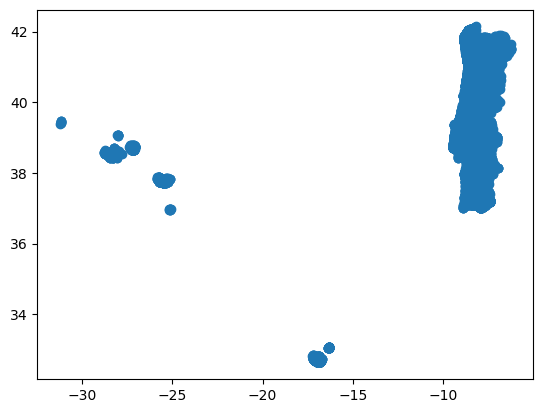

In [26]:
plt.scatter(x=data["Longitude GPS"], y=data["Latitude GPS"])

### Evolução do número de vítimas mortais

In [27]:
print(data.shape)

total_vitimas_mortais = data['Num. Mortos a 30 dias SUM'].sum()
print(total_vitimas_mortais)

total_vitimas_mortais = data['Num. Feridos graves a 30 dias SUM'].sum()
print(total_vitimas_mortais)

total_vitimas_mortais = data['Num. Feridos ligeiros a 30 dias SUM'].sum()
print(total_vitimas_mortais)


(36595, 50)
587
2550
42878


### Número de vítimas por Distrito

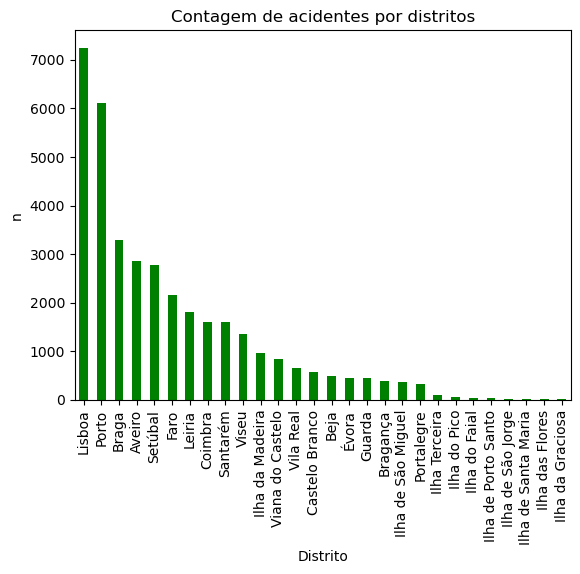

In [28]:
distritos = data["Distrito"].value_counts()
distritos.plot(kind = "bar", color="green")
plt.title("Contagem de acidentes por distritos")
plt.xlabel("Distrito")
plt.ylabel("n")
plt.show()

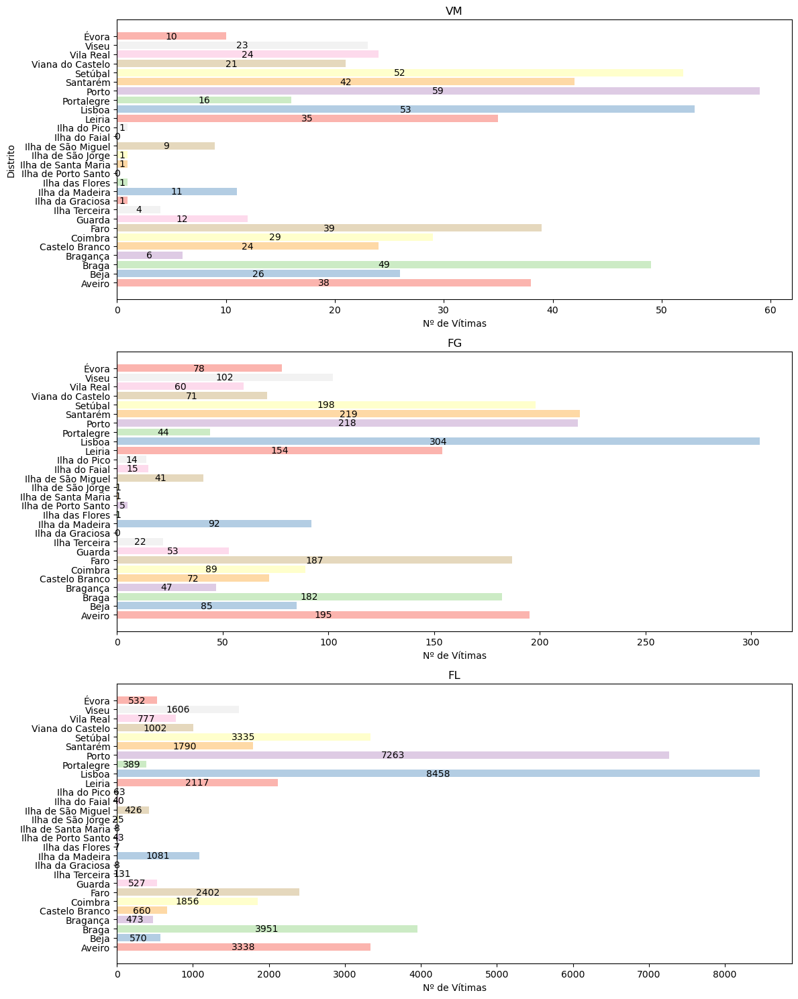

In [29]:
vitimas_por_distrito = data.groupby('Distrito')[['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']].sum()

paleta_cores = sns.color_palette("Pastel1", n_colors=len(vitimas_por_distrito))

fig, axes = plt.subplots(3, 1, figsize=(12, 15))  # Tamanho ajustado para barras horizontais

tipos = ['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']
titulos = ['VM', 'FG', 'FL']

for i, tipo in enumerate(tipos):
    bars = axes[i].barh(vitimas_por_distrito.index, vitimas_por_distrito[tipo], color=paleta_cores)
    
    axes[i].set_title(titulos[i])  # Alterar o título para VM, FG e FL
    axes[i].set_xlabel('Nº de Vítimas')
    
    for bar in bars:
        largura = bar.get_width()
        axes[i].annotate(f'{int(largura)}',  # Texto da legenda
                         xy=(largura / 2, bar.get_y() + bar.get_height() / 2),  
                         ha='center', va='center', fontsize=10, color='black')  
        
    if i == 0:  
        axes[i].set_ylabel('Distrito')

plt.tight_layout()
plt.show()


### Numero de vitimas por milhao de habitantes

In [30]:
Total_Vitimas =  data['Num. Mortos a 30 dias SUM'].sum() + data['Num. Feridos graves a 30 dias SUM'].sum() + data['Num. Feridos ligeiros a 30 dias SUM'].sum()
Populacao = 10530000

Vitimas_por_milhao = (Total_Vitimas / Populacao) * 1_000_000
print(Vitimas_por_milhao)

4369.895536562203


In [31]:
Total_Vitimas =  data['Num. Mortos a 30 dias SUM'].sum()
Populacao = 10530000

Vitimas_por_milhao = (Total_Vitimas / Populacao) * 1_000_000
print(Vitimas_por_milhao)

55.745489078822416


In [32]:
Total_Vitimas = data['Num. Feridos graves a 30 dias SUM'].sum()
Populacao = 10530000

Vitimas_por_milhao = (Total_Vitimas / Populacao) * 1_000_000
print(Vitimas_por_milhao)

242.16524216524218


### Natureza de acidente por Distrito

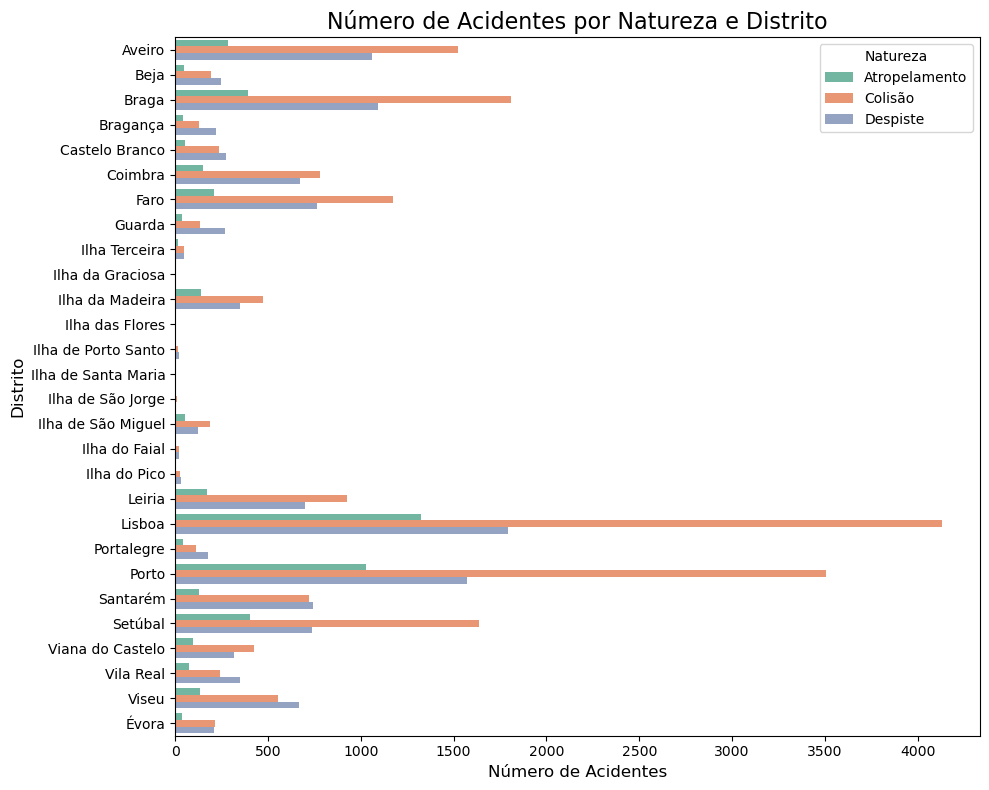

In [33]:
natureza_distrito = data.groupby(['Distrito', 'Natureza_simples']).size().reset_index(name='Count')

plt.figure(figsize=(10, 8))

sns.barplot(data=natureza_distrito, y='Distrito', x='Count', hue='Natureza_simples', palette='Set2')

plt.title('Número de Acidentes por Natureza e Distrito', fontsize=16)
plt.xlabel('Número de Acidentes', fontsize=12)
plt.ylabel('Distrito', fontsize=12)

plt.legend(title='Natureza', loc='upper right')

plt.tight_layout()
plt.show()

## Análise de Lisboa - Entender as carateristicas dos acidentes em Lisboa

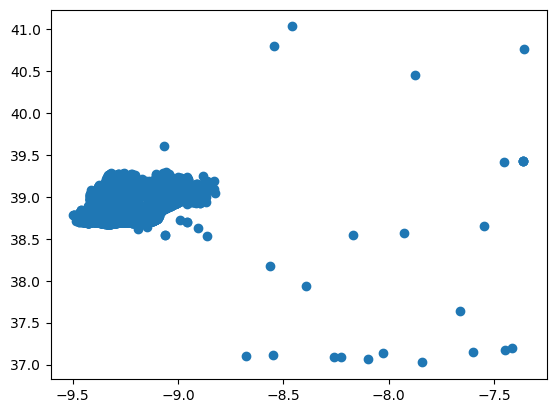

In [34]:
plt.scatter(x=data.loc[data["Distrito"] == "Lisboa","Longitude GPS"], y=data.loc[data["Distrito"] == "Lisboa","Latitude GPS"])

In [35]:
dataLisboa = data.loc[(data["Distrito"] == "Lisboa") & (data["Latitude GPS"] >= 38.67) & (data["Latitude GPS"] <= 39.3) & (data["Longitude GPS"] >= -9.50) & (data["Longitude GPS"] <= -8.78)  , data.columns != "Distrito"].copy()

In [36]:
dataLisboa.shape

(7212, 49)

In [37]:
dataLisboa.head()

,Id. Acidente,Datahora,Ano,Mês,Dia,Hora,Entidades Fiscalizadoras,Velocidade geral,Velocidade local,Dia da Semana,Latitude GPS,Longitude GPS,Num. Mortos a 30 dias SUM,Num. Feridos graves a 30 dias SUM,Num. Feridos ligeiros a 30 dias SUM,Características Tecnicas1,Cond Aderência,Concelho,Freguesia,Nome arruamento,Tipos Vias,Cod Via,Nome Outra Via,Km,Desc. Esquema,Estado Conservação,Factores Atmosféricos,Reg Circulação1,Intersecção Vias,Localizações,Luminosidade,Marca Via,Natureza,Obras Arte,Obstáculos,Sentidos,Sinais,Sinais Luminosos,Tipo Piso,Traçado 1,Traçado 2,Traçado 3,Traçado 4,Via Trânsito,Natureza_simples,V_geral_local_diferentes,V_local_categoria,acidente_grave,momento_dia
8,20232565059,2023-01-01 02:10:00,2023,Jan,1900-01-01 00:00:00,2,Polícia de Segurança Pública,50,50,Domingo,38.704531,-9.160449,0,0,1,Estrada sem separador,Seco e limpo,Lisboa,Estrela,Avenida 24 de Julho ...,Arruamento,0,NaN,NaN,Acid. c/ 2 ou mais veíc. - mudança direcção -...,Em bom estado,Bom tempo,Dois sentidos,Fora da intersecção,Dentro das localidades,"Noite, com iluminação",Com marcas - separadoras de sentido de trânsito,Colisão frontal,NaN,Inexistentes,NaN,Outros,Inexistentes,Betuminoso,Recta,Em patamar,Sem berma ou impraticável,Em plena via,Direita,Colisão,Não,v = 50,não grave,noite
13,20232550020,2023-01-01 04:50:00,2023,Jan,1900-01-01 00:00:00,4,Polícia de Segurança Pública,80,80,Domingo,38.740841,-9.201133,0,0,3,Outra via,Seco e limpo,Lisboa,Benfica,NaN,IC - Itinerário Complementar,IC19,NaN,0.2,Acid. c/ 2 ou mais veíc. - s/ mudança direcçã...,Em estado regular,Bom tempo,Sentido único,Fora da intersecção,Dentro das localidades,"Noite, com iluminação",Com marcas - separadoras de sentido e de vias ...,Colisão traseira com outro veículo em movimento,NaN,Inexistentes,No sentido decrescente da quilometragem,NaN,Inexistentes,Betuminoso,Curva,Em patamar,Berma pavimentada,Em plena via,Direita,Colisão,Não,50 < v <= 90,não grave,noite
22,20232561743,2023-01-01 10:30:00,2023,Jan,1900-01-01 00:00:00,10,Polícia de Segurança Pública,50,50,Domingo,38.737107,-9.339389,0,0,1,Estrada sem separador,Seco e limpo,Cascais,São Domingos de Rana,Largo 7 de Junho,Arruamento,0,NaN,NaN,NaN,Em bom estado,Bom tempo,Dois sentidos,Fora da intersecção,Dentro das localidades,Em pleno dia,Com marcas - separadoras de sentido de trânsito,Atropelamento com fuga,NaN,Inexistentes,NaN,Outros,Inexistentes,Betuminoso,Recta,Em patamar,Berma pavimentada,Em plena via,Direita,Atropelamento,Não,v = 50,não grave,manha
24,20232548109,2023-01-01 11:55:00,2023,Jan,1900-01-01 00:00:00,11,Polícia de Segurança Pública,50,50,Domingo,38.830746,-9.169115,0,0,2,Estrada sem separador,Seco e limpo,Loures,Loures,Avenida Doutor António Carvalho de Figueiredo ...,Arruamento,0,NaN,NaN,"Acid. só c/ 1 veíc. s/ obst., animais, etc. - D7",Em estado regular,Bom tempo,Sentido único,Fora da intersecção,Dentro das localidades,Em pleno dia,Com marcas - separadoras de sentido e de vias ...,Colisão com outras situações,NaN,Inexistentes,NaN,NaN,Inexistentes,Betuminoso,Recta,Com inclinação,Berma pavimentada,Em plena via,Esquerda,Colisão,Não,v = 50,não grave,manha
30,20232541822,2023-01-01 13:10:00,2023,Jan,1900-01-01 00:00:00,13,Polícia de Segurança Pública,50,50,Domingo,38.750393,-9.206963,0,0,1,Estrada sem separador,Molhado,Lisboa,Benfica,Rua João Frederico Ludovice ...,Arruamento,0,NaN,NaN,Acid. c/ peões - A1,Em estado regular,Chuva,Sentido único,Fora da intersecção,Dentro das localidades,Em pleno dia,Sem marcas rodoviárias ou pouco visíveis,Atropelamento de peões,NaN,Inexistentes,NaN,Passagem de peões,Inexistentes,Betuminoso,Recta,Em patamar,Sem berma ou impraticável,Em plena via,Direita,Atropelamento,Não,v = 50,não grave,tarde


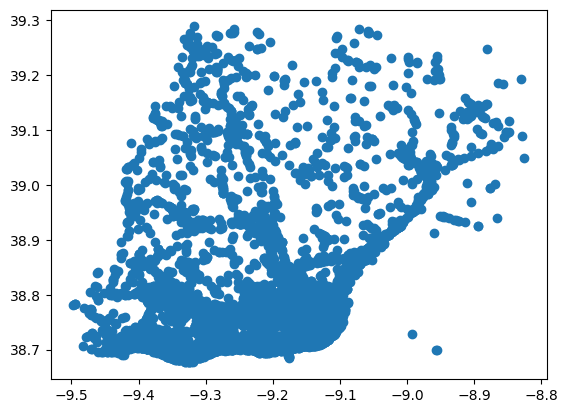

In [38]:
plt.scatter(x=dataLisboa["Longitude GPS"], y=dataLisboa["Latitude GPS"])

## Análise Lisboa - Entender como se comporta a existência de diferentes tipos de vítimas para cada variável

#### Distribuição das vítimas de acidentes por mês

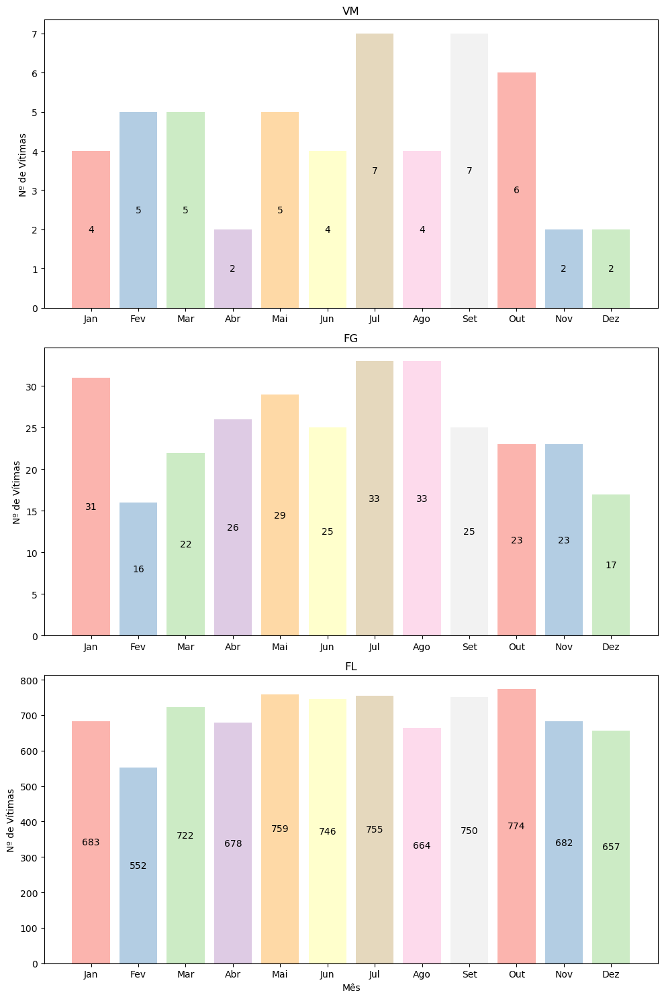

In [39]:
dataLisboa['Mês'] = pd.Categorical(dataLisboa['Mês'], categories=['Jan', 'Fev', 'Mar', 'Abr', 'Mai', 'Jun', 
                                                                  'Jul', 'Ago', 'Set', 'Out', 'Nov', 'Dez'], ordered=True)

vitimas_por_mes = dataLisboa.groupby('Mês')[['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']].sum()

paleta_cores = sns.color_palette("Pastel1", n_colors=len(vitimas_por_mes))

fig, axes = plt.subplots(3, 1, figsize=(10, 15))

tipos = ['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']
titulos = ['VM', 'FG', 'FL']

for i, tipo in enumerate(tipos):
    bars = axes[i].bar(vitimas_por_mes.index, vitimas_por_mes[tipo], color=paleta_cores)
    
    axes[i].set_title(titulos[i]) 
    axes[i].set_ylabel('Nº de Vítimas')
    
    for bar in bars:
        altura = bar.get_height()
        axes[i].annotate(f'{int(altura)}', 
                         xy=(bar.get_x() + bar.get_width() / 2, altura / 2),  
                         ha='center', va='center', fontsize=10, color='black')  
    
    if i == len(tipos) - 1:
        axes[i].set_xlabel('Mês')

plt.tight_layout()
plt.show()

In [40]:
acidentes_por_mes =  dataLisboa['Mês'].value_counts().sort_index()

vitimas_por_mes = dataLisboa.groupby('Mês')[['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']].sum()

taxas = (vitimas_por_mes.div(acidentes_por_mes, axis=0)) * 100

tabela = pd.concat([acidentes_por_mes, vitimas_por_mes, taxas], axis=1)
tabela.columns = ['Nº Acidentes', 'Total_VM', 'Total_FG', 'Total_FL', 'Taxa_VM', 'Taxa_FG', 'Taxa_FL']

print(tabela)

     Nº Acidentes  Total_VM  Total_FG  Total_FL   Taxa_VM   Taxa_FG  \
Mês                                                                   
Jan           576         4        31       683  0.694444  5.381944   
Fev           473         5        16       552  1.057082  3.382664   
Mar           617         5        22       722  0.810373  3.565640   
Abr           588         2        26       678  0.340136  4.421769   
Mai           676         5        29       759  0.739645  4.289941   
Jun           630         4        25       746  0.634921  3.968254   
Jul           636         7        33       755  1.100629  5.188679   
Ago           557         4        33       664  0.718133  5.924596   
Set           632         7        25       750  1.107595  3.955696   
Out           664         6        23       774  0.903614  3.463855   
Nov           584         2        23       682  0.342466  3.938356   
Dez           579         2        17       657  0.345423  2.936097   

     

#### Distribuição das vítimas de acidentes por dia da semana

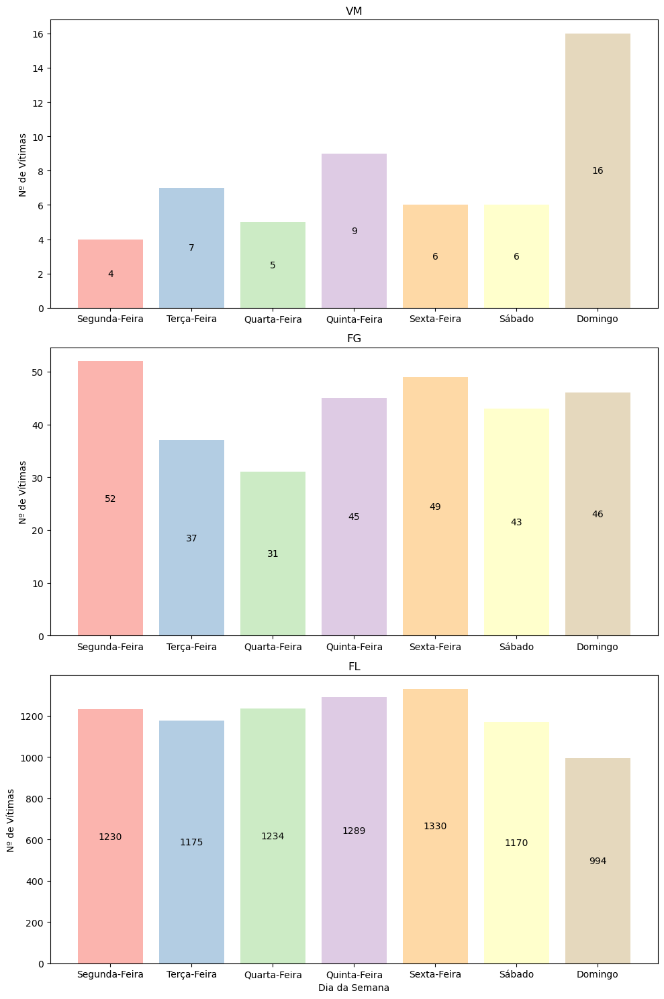

In [41]:
dataLisboa['Dia da Semana'] = pd.Categorical(dataLisboa['Dia da Semana'], categories=['Segunda-Feira', 'Terça-Feira', 'Quarta-Feira', 'Quinta-Feira', 'Sexta-Feira', 'Sábado', 'Domingo'], ordered=True)

vitimas_por_diaSemana = dataLisboa.groupby('Dia da Semana')[['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']].sum()

paleta_cores = sns.color_palette("Pastel1", n_colors=len(vitimas_por_diaSemana))

fig, axes = plt.subplots(3, 1, figsize=(10, 15))

tipos = ['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']
titulos = ['VM', 'FG', 'FL']

for i, tipo in enumerate(tipos):
    bars = axes[i].bar(vitimas_por_diaSemana.index, vitimas_por_diaSemana[tipo], color=paleta_cores)
    
    axes[i].set_title(titulos[i])  
    axes[i].set_ylabel('Nº de Vítimas')
    
    for bar in bars:
        altura = bar.get_height()
        axes[i].annotate(f'{int(altura)}', 
                         xy=(bar.get_x() + bar.get_width() / 2, altura / 2), 
                         ha='center', va='center', fontsize=10, color='black')
    
    if i == len(tipos) - 1:
        axes[i].set_xlabel('Dia da Semana')

plt.tight_layout()
plt.show()


In [42]:
acidentes_por_diaSemana =  dataLisboa['Dia da Semana'].value_counts().sort_index()

taxas = (vitimas_por_diaSemana.div(acidentes_por_diaSemana, axis=0)) * 100

tabela = pd.concat([acidentes_por_diaSemana, vitimas_por_diaSemana, taxas], axis=1)
tabela.columns = ['Nº Acidentes', 'Total_VM', 'Total_FG', 'Total_FL', 'Taxa_VM', 'Taxa_FG', 'Taxa_FL']

print(tabela)

               Nº Acidentes  Total_VM  Total_FG  Total_FL   Taxa_VM   Taxa_FG  \
Dia da Semana                                                                   
Segunda-Feira          1068         4        52      1230  0.374532  4.868914   
Terça-Feira            1018         7        37      1175  0.687623  3.634578   
Quarta-Feira           1075         5        31      1234  0.465116  2.883721   
Quinta-Feira           1111         9        45      1289  0.810081  4.050405   
Sexta-Feira            1137         6        49      1330  0.527704  4.309587   
Sábado                  958         6        43      1170  0.626305  4.488518   
Domingo                 845        16        46       994  1.893491  5.443787   

                  Taxa_FL  
Dia da Semana              
Segunda-Feira  115.168539  
Terça-Feira    115.422397  
Quarta-Feira   114.790698  
Quinta-Feira   116.021602  
Sexta-Feira    116.974494  
Sábado         122.129436  
Domingo        117.633136  


#### Número de vítimas e tipologia segundo o periodo horário

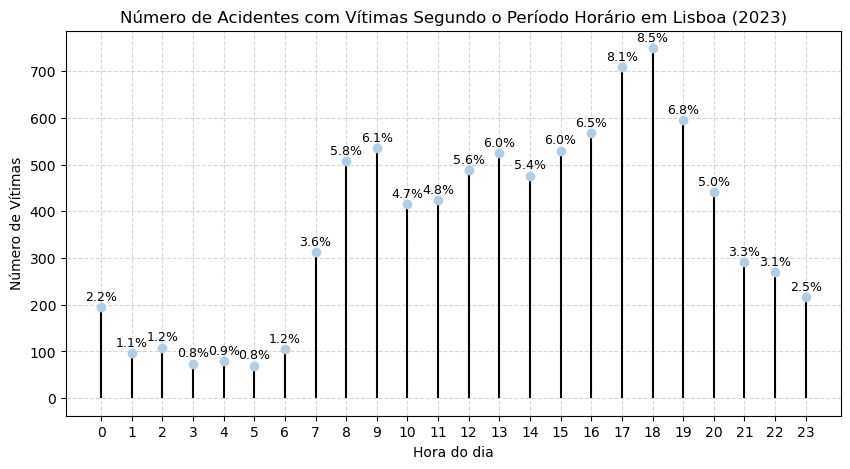

In [43]:
acidentes_por_hora = dataLisboa.groupby('Hora')[['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']].sum()

total_vitimas_por_hora = acidentes_por_hora.sum(axis=1)

percentagens = (total_vitimas_por_hora / total_vitimas_por_hora.sum()) * 100

cor_pontos = sns.color_palette("Pastel1")[1]  

plt.figure(figsize=(10, 5))

stem_plot = plt.stem(total_vitimas_por_hora.index, total_vitimas_por_hora.values, 
                     linefmt='black', markerfmt='o', basefmt=" ")

plt.setp(stem_plot.markerline, color=cor_pontos) 
plt.setp(stem_plot.stemlines, color='black')  

for x, y, pct in zip(total_vitimas_por_hora.index, total_vitimas_por_hora.values, percentagens):
    plt.annotate(f'{pct:.1f}%', xy=(x, y), xytext=(0, 5),  
                 textcoords='offset points', ha='center', fontsize=9, color='black')

plt.title('Número de Acidentes com Vítimas Segundo o Período Horário em Lisboa (2023)')
plt.xlabel('Hora do dia')
plt.ylabel('Número de Vítimas')
plt.grid(True, linestyle='--', alpha=0.5)
plt.xticks(range(0, 24))  
plt.show()

#### Número de vítimas e tipologia por tipo de via

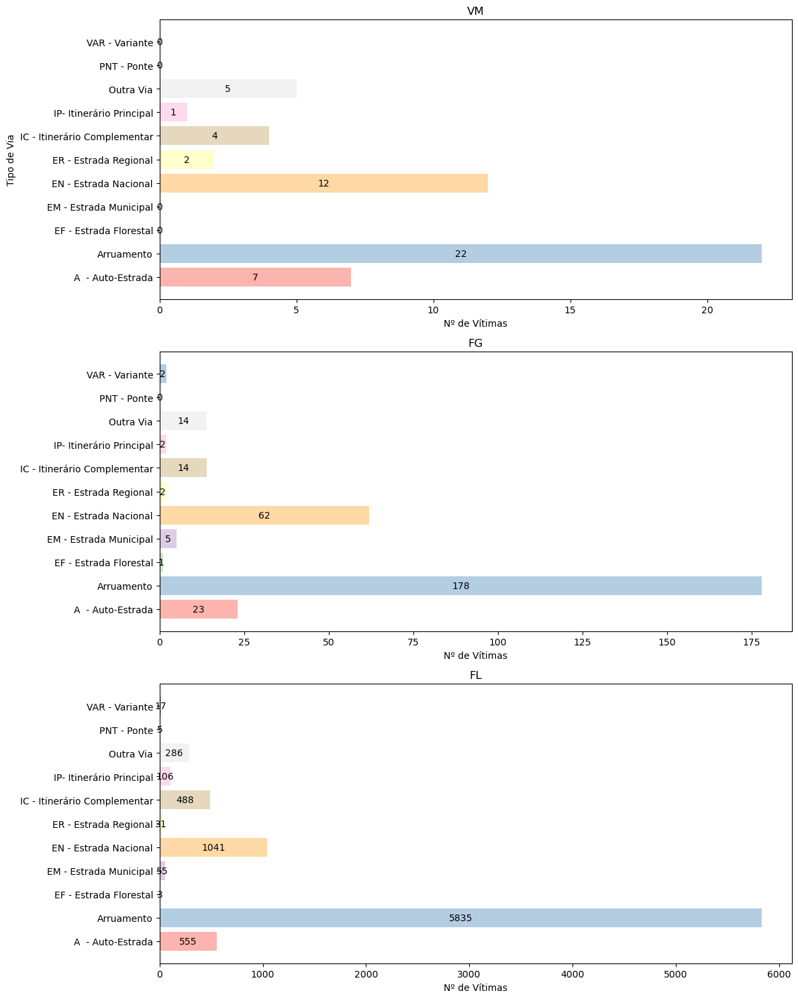

In [44]:
vitimas_por_tipoVia = dataLisboa.groupby('Tipos Vias')[['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']].sum()

paleta_cores = sns.color_palette("Pastel1", n_colors=len(vitimas_por_tipoVia))

fig, axes = plt.subplots(3, 1, figsize=(12, 15))  


tipos = ['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']
titulos = ['VM', 'FG', 'FL']

for i, tipo in enumerate(tipos):
    bars = axes[i].barh(vitimas_por_tipoVia.index, vitimas_por_tipoVia[tipo], color=paleta_cores)
    
    axes[i].set_title(titulos[i])  
    axes[i].set_xlabel('Nº de Vítimas')
    
    for bar in bars:
        largura = bar.get_width()
        axes[i].annotate(f'{int(largura)}', 
                         xy=(largura / 2, bar.get_y() + bar.get_height() / 2),  
                         ha='center', va='center', fontsize=10, color='black')  
    
    if i == 0:  
        axes[i].set_ylabel('Tipo de Via')

plt.tight_layout()
plt.show()

In [45]:
acidentes_por_tipoVia =  dataLisboa['Tipos Vias'].value_counts().sort_index()

taxas = (vitimas_por_tipoVia.div(acidentes_por_tipoVia, axis=0)) * 100

tabela = pd.concat([acidentes_por_tipoVia, vitimas_por_tipoVia, taxas], axis=1)
tabela.columns = ['Nº Acidentes', 'Total_VM', 'Total_FG', 'Total_FL', 'Taxa_VM', 'Taxa_FG', 'Taxa_FL']

print(tabela)

                              Nº Acidentes  Total_VM  Total_FG  Total_FL  \
Tipos Vias                                                                 
A  - Auto-Estrada                      392         7        23       555   
Arruamento                            5146        22       178      5835   
EF - Estrada Florestal                   4         0         1         3   
EM - Estrada Municipal                  49         0         5        55   
EN - Estrada Nacional                  881        12        62      1041   
ER - Estrada Regional                   27         2         2        31   
IC - Itinerário Complementar           366         4        14       488   
IP- Itinerário Principal                90         1         2       106   
Outra Via                              239         5        14       286   
PNT - Ponte                              3         0         0         5   
VAR - Variante                          15         0         2        17   

           

### Numero de vitimas e tipologia segundo a natureza do acidente

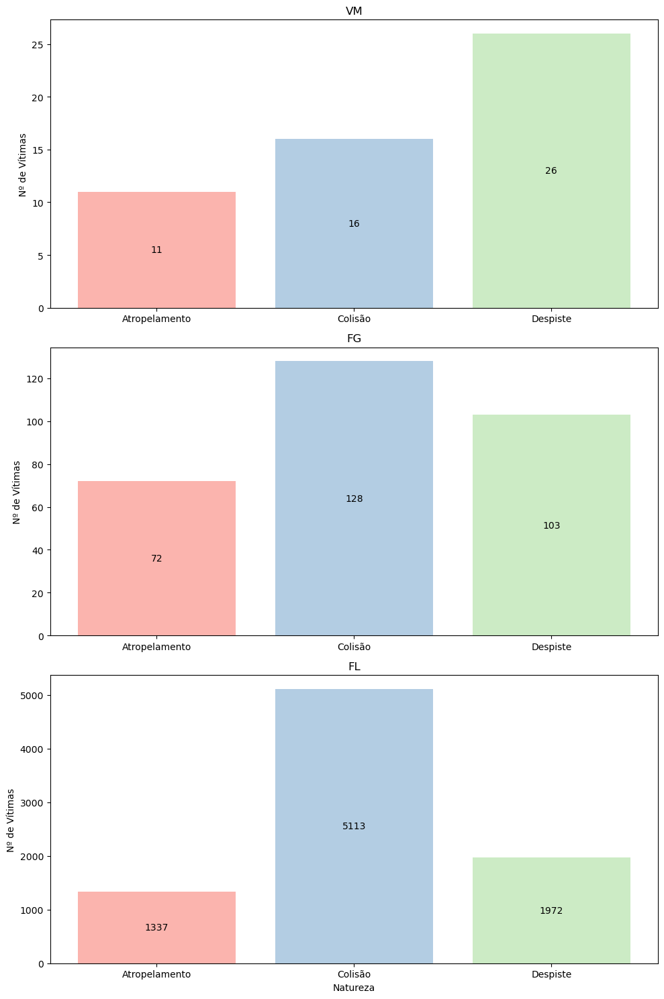

In [46]:
vitimas_por_natureza = dataLisboa.groupby('Natureza_simples')[['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']].sum()

paleta_cores = sns.color_palette("Pastel1", n_colors=len(vitimas_por_natureza))

fig, axes = plt.subplots(3, 1, figsize=(10, 15))

tipos = ['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']
titulos = ['VM', 'FG', 'FL']

for i, tipo in enumerate(tipos):
    bars = axes[i].bar(vitimas_por_natureza.index, vitimas_por_natureza[tipo], color=paleta_cores)
    
    axes[i].set_title(titulos[i])  
    axes[i].set_ylabel('Nº de Vítimas')
    
    for bar in bars:
        altura = bar.get_height()
        axes[i].annotate(f'{int(altura)}',  
                         xy=(bar.get_x() + bar.get_width() / 2, altura / 2), 
                         ha='center', va='center', fontsize=10, color='black') 
    
    if i == len(tipos) - 1:
        axes[i].set_xlabel('Natureza')

plt.tight_layout()
plt.show()

In [47]:
acidentes_por_natureza =  dataLisboa['Natureza_simples'].value_counts().sort_index()

taxas = (vitimas_por_natureza.div(acidentes_por_natureza, axis=0)) * 100

tabela = pd.concat([acidentes_por_natureza, vitimas_por_natureza, taxas], axis=1)
tabela.columns = ['Nº Acidentes', 'Total_VM', 'Total_FG', 'Total_FL', 'Taxa_VM', 'Taxa_FG', 'Taxa_FL']

print(tabela)

                  Nº Acidentes  Total_VM  Total_FG  Total_FL   Taxa_VM  \
Natureza_simples                                                         
Atropelamento             1317        11        72      1337  0.835232   
Colisão                   4110        16       128      5113  0.389294   
Despiste                  1785        26       103      1972  1.456583   

                   Taxa_FG     Taxa_FL  
Natureza_simples                        
Atropelamento     5.466970  101.518603  
Colisão           3.114355  124.403893  
Despiste          5.770308  110.476190  


#### Tipo de via e natureza

<Figure size 1200x800 with 0 Axes>

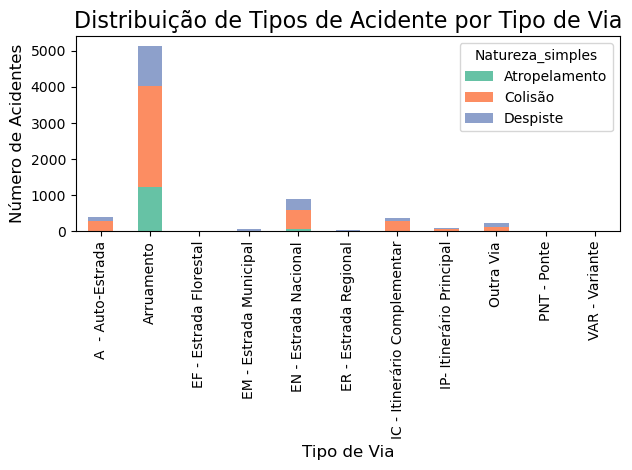

In [48]:
acidentes_por_tipo_natureza = dataLisboa.groupby(['Tipos Vias', 'Natureza_simples']).size().unstack(fill_value=0)

plt.figure(figsize=(12, 8))
acidentes_por_tipo_natureza.plot(kind='bar', stacked=True, color=sns.color_palette("Set2", n_colors=3))

plt.title('Distribuição de Tipos de Acidente por Tipo de Via', fontsize=16)
plt.xlabel('Tipo de Via', fontsize=12)
plt.ylabel('Número de Acidentes', fontsize=12)

plt.tight_layout()
plt.show()

#### Número de vítimas e tipologia segundo o estado de conservação da via

In [49]:
vitimas_pelo_estadoVia = dataLisboa.groupby('Estado Conservação')[['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']].sum()
acidentes_pelo_estadoVia =  dataLisboa['Estado Conservação'].value_counts().sort_index()

taxas = (vitimas_pelo_estadoVia.div(acidentes_pelo_estadoVia, axis=0)) * 100

tabela = pd.concat([acidentes_pelo_estadoVia, vitimas_pelo_estadoVia, taxas], axis=1)
tabela.columns = ['Nº Acidentes', 'Total_VM', 'Total_FG', 'Total_FL', 'Taxa_VM', 'Taxa_FG', 'Taxa_FL']

print(tabela)

                    Nº Acidentes  Total_VM  Total_FG  Total_FL   Taxa_VM  \
Estado Conservação                                                         
Em bom estado               2832        25       138      3335  0.882768   
Em estado regular           4252        28       157      4938  0.658514   
Em mau estado                112         0         8       132  0.000000   

                     Taxa_FG     Taxa_FL  
Estado Conservação                        
Em bom estado       4.872881  117.761299  
Em estado regular   3.692380  116.133584  
Em mau estado       7.142857  117.857143  


### Numero de vitimas e tipologia segundo fatores atmosfericos

In [50]:
vitimas_pela_meteorologia = dataLisboa.groupby('Factores Atmosféricos')[['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']].sum()
acidentes_pela_meteorologia =  dataLisboa['Factores Atmosféricos'].value_counts().sort_index()

taxas = (vitimas_pela_meteorologia.div(acidentes_pela_meteorologia, axis=0)) * 100

tabela = pd.concat([acidentes_pela_meteorologia, vitimas_pela_meteorologia, taxas], axis=1)
tabela.columns = ['Nº Acidentes', 'Total_VM', 'Total_FG', 'Total_FL', 'Taxa_VM', 'Taxa_FG', 'Taxa_FL']

print(tabela)

                       Nº Acidentes  Total_VM  Total_FG  Total_FL    Taxa_VM  \
Factores Atmosféricos                                                          
Bom tempo                      6323        46       273      7362   0.727503   
Chuva                           818         6        26       981   0.733496   
Granizo                           3         0         0         4   0.000000   
Neve                              2         1         2         2  50.000000   
Nevoeiro                         23         0         2        24   0.000000   
Nuvem de fumo                     1         0         0         1   0.000000   
Vento Forte                      13         0         0        16   0.000000   

                          Taxa_FG     Taxa_FL  
Factores Atmosféricos                          
Bom tempo                4.317571  116.432073  
Chuva                    3.178484  119.926650  
Granizo                  0.000000  133.333333  
Neve                   100.000000  100.

#### Número de vítimas e tipologia segundo a localização (concelhos de Lisboa)

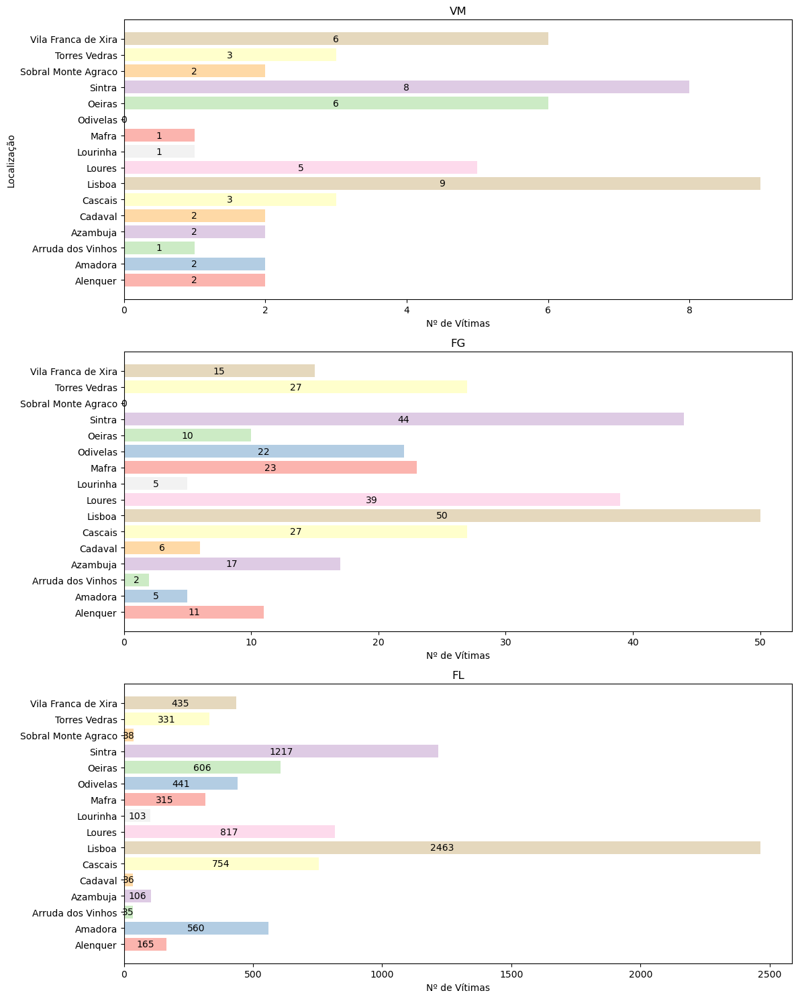

In [51]:
vitimas_pela_localizacao = dataLisboa.groupby('Concelho')[['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']].sum()
paleta_cores = sns.color_palette("Pastel1", n_colors=len(vitimas_pela_localizacao))

fig, axes = plt.subplots(3, 1, figsize=(12, 15)) 

# Dados para os gráficos
tipos = ['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']
titulos = ['VM', 'FG', 'FL']

for i, tipo in enumerate(tipos):
    # Criar as barras horizontais
    bars = axes[i].barh(vitimas_pela_localizacao.index, vitimas_pela_localizacao[tipo], color=paleta_cores)
    
    # Definir o título e os rótulos
    axes[i].set_title(titulos[i])  # Alterar o título para VM, FG e FL
    axes[i].set_xlabel('Nº de Vítimas')
    
    # Adicionar valores absolutos no meio das barras
    for bar in bars:
        largura = bar.get_width()
        axes[i].annotate(f'{int(largura)}',  # Texto da legenda
                         xy=(largura / 2, bar.get_y() + bar.get_height() / 2),  # Coordenadas (centro da barra)
                         ha='center', va='center', fontsize=10, color='black')  # Texto centralizado e preto
    
    if i == 0:  # Apenas no primeiro gráfico para evitar sobreposição
        axes[i].set_ylabel('Localização')

plt.tight_layout()
plt.show()

In [52]:
vitimas_pela_localizacao = dataLisboa.groupby('Concelho')[['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']].sum()
acidentes_pela_localizacao =  dataLisboa['Concelho'].value_counts().sort_index()

taxas = (vitimas_pela_localizacao.div(acidentes_pela_localizacao, axis=0)) * 100

tabela = pd.concat([acidentes_pela_localizacao, vitimas_pela_localizacao, taxas], axis=1)
tabela.columns = ['Nº Acidentes', 'Total_VM', 'Total_FG', 'Total_FL', 'Taxa_VM', 'Taxa_FG', 'Taxa_FL']

print(tabela)

                     Nº Acidentes  Total_VM  Total_FG  Total_FL   Taxa_VM  \
Concelho                                                                    
Alenquer                      144         2        11       165  1.388889   
Amadora                       459         2         5       560  0.435730   
Arruda dos Vinhos              30         1         2        35  3.333333   
Azambuja                       85         2        17       106  2.352941   
Cadaval                        35         2         6        36  5.714286   
Cascais                       642         3        27       754  0.467290   
Lisboa                       2162         9        50      2463  0.416281   
Loures                        665         5        39       817  0.751880   
Lourinha                       93         1         5       103  1.075269   
Mafra                         271         1        23       315  0.369004   
Odivelas                      386         0        22       441  0.000000   

#### Fatalidade dos acidentes

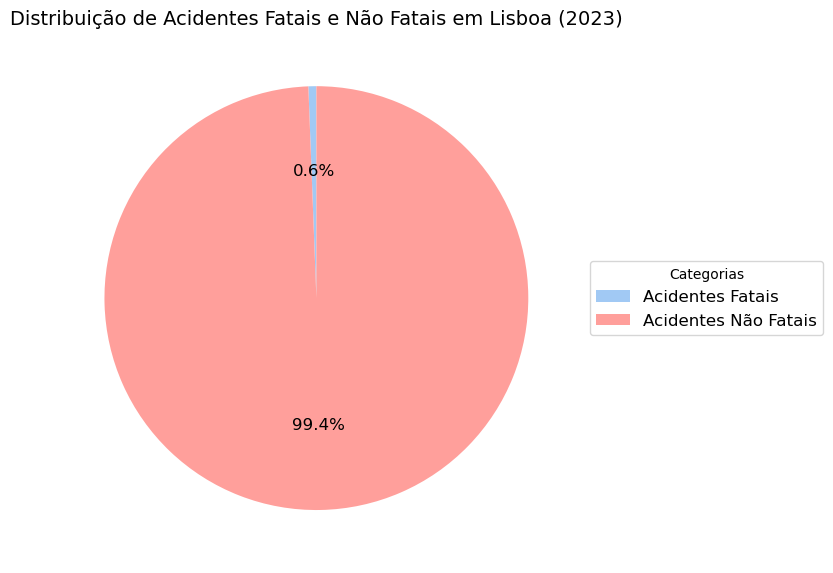

In [53]:
total_fatais = dataLisboa['Num. Mortos a 30 dias SUM'].sum()
total_nao_fatais = dataLisboa['Num. Feridos graves a 30 dias SUM'].sum() + dataLisboa['Num. Feridos ligeiros a 30 dias SUM'].sum()

labels = ['Acidentes Fatais', 'Acidentes Não Fatais']
valores = [total_fatais, total_nao_fatais]

cores_pastel = sns.color_palette("pastel")
cores = [cores_pastel[0], cores_pastel[3]]  

plt.figure(figsize=(8, 8))

wedges, texts, autotexts = plt.pie(
    valores, autopct='%1.1f%%', colors=cores, startangle=90, textprops={'fontsize': 12}
)

plt.legend(wedges, labels, title="Categorias", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1), fontsize=12)

plt.title('Distribuição de Acidentes Fatais e Não Fatais em Lisboa (2023)', fontsize=14)
plt.tight_layout()
plt.show()


### Numero de vitimas e tipologia segundo a luminosidade

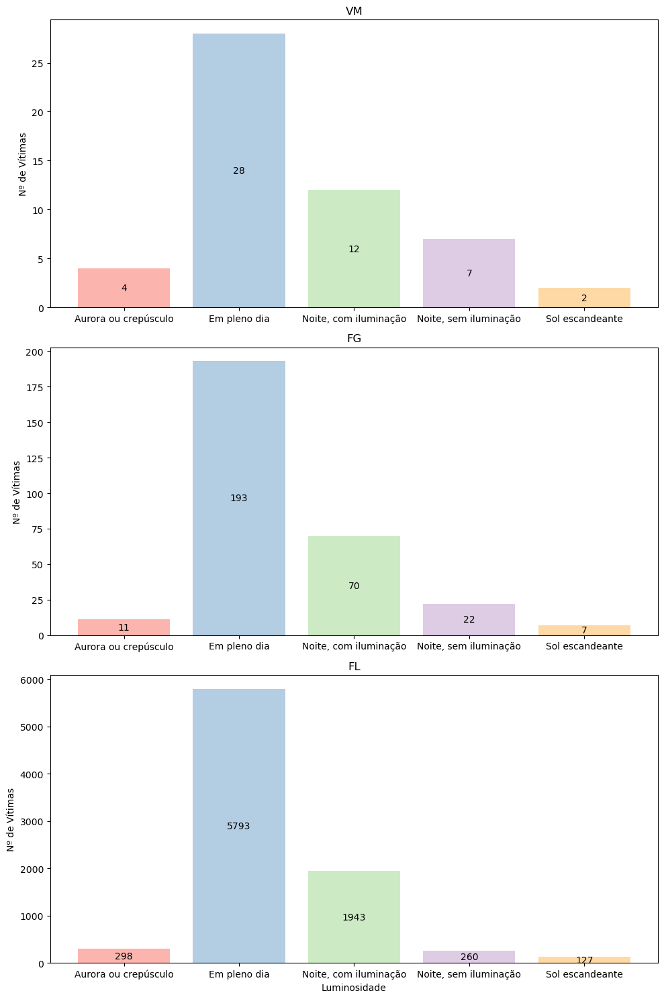

In [54]:
vitimas_por_luminosidade = dataLisboa.groupby('Luminosidade')[['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']].sum()

paleta_cores = sns.color_palette("Pastel1", n_colors=len(vitimas_por_luminosidade))

fig, axes = plt.subplots(3, 1, figsize=(10, 15))

tipos = ['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']
titulos = ['VM', 'FG', 'FL']

for i, tipo in enumerate(tipos):
    bars = axes[i].bar(vitimas_por_luminosidade.index, vitimas_por_luminosidade[tipo], color=paleta_cores)
    
    axes[i].set_title(titulos[i])  
    axes[i].set_ylabel('Nº de Vítimas')
    
    for bar in bars:
        altura = bar.get_height()
        axes[i].annotate(f'{int(altura)}',  
                         xy=(bar.get_x() + bar.get_width() / 2, altura / 2),  
                         ha='center', va='center', fontsize=10, color='black')
    
    if i == len(tipos) - 1:
        axes[i].set_xlabel('Luminosidade')

plt.tight_layout()
plt.show()

#### Número de vítimas e tipologia por tipo de piso

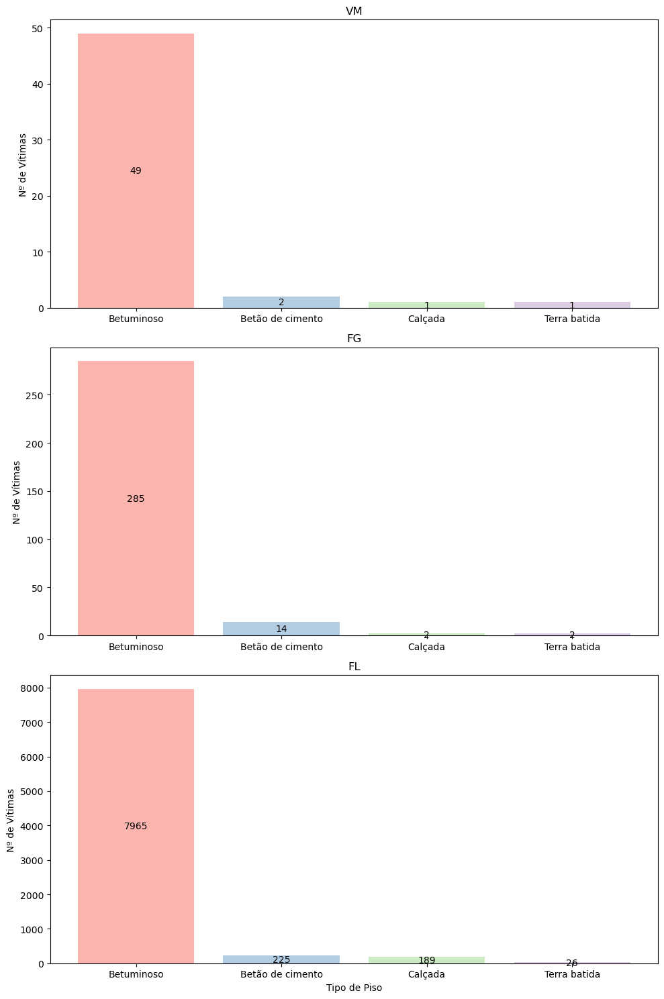

In [55]:
vitimas_por_tipoPiso = dataLisboa.groupby('Tipo Piso')[['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']].sum()

paleta_cores = sns.color_palette("Pastel1", n_colors=len(vitimas_por_tipoPiso))

fig, axes = plt.subplots(3, 1, figsize=(10, 15))

tipos = ['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']
titulos = ['VM', 'FG', 'FL']

for i, tipo in enumerate(tipos):
    bars = axes[i].bar(vitimas_por_tipoPiso.index, vitimas_por_tipoPiso[tipo], color=paleta_cores)
    
    axes[i].set_title(titulos[i])  
    axes[i].set_ylabel('Nº de Vítimas')
    
    for bar in bars:
        altura = bar.get_height()
        axes[i].annotate(f'{int(altura)}',  
                         xy=(bar.get_x() + bar.get_width() / 2, altura / 2),  
                         ha='center', va='center', fontsize=10, color='black') 
    
    if i == len(tipos) - 1:
        axes[i].set_xlabel('Tipo de Piso')

plt.tight_layout()
plt.show()

#### Número de vítimas e tipologia por interseção de vias

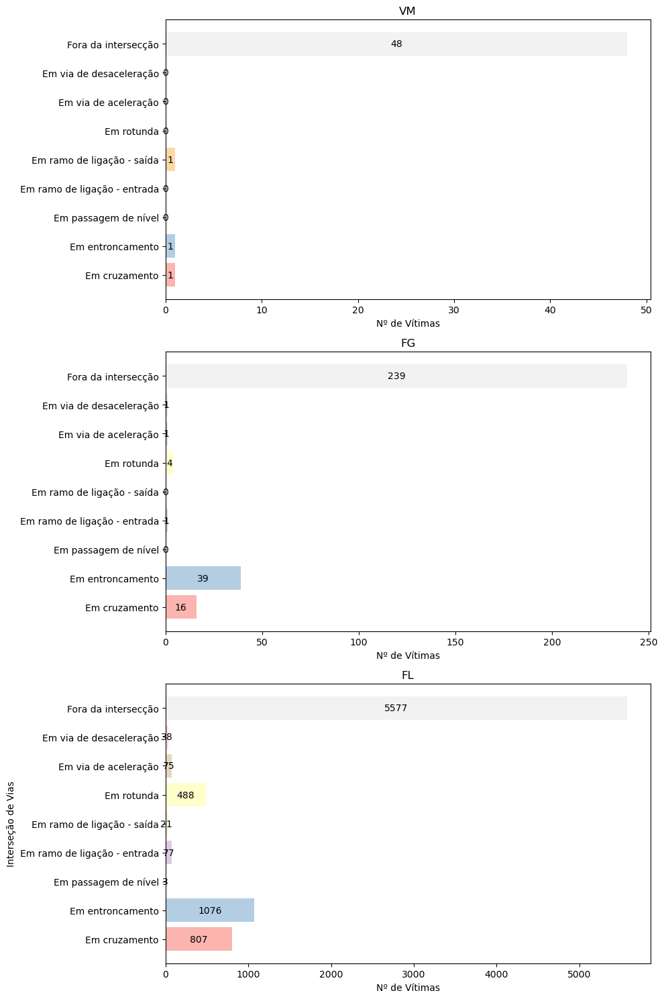

In [56]:
vitimas_por_intersecaoVias = dataLisboa.groupby('Intersecção Vias')[['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']].sum()

paleta_cores = sns.color_palette("Pastel1", n_colors=len(vitimas_por_intersecaoVias))

fig, axes = plt.subplots(3, 1, figsize=(10, 15))

tipos = ['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']
titulos = ['VM', 'FG', 'FL']

for i, tipo in enumerate(tipos):
    bars = axes[i].barh(vitimas_por_intersecaoVias.index, vitimas_por_intersecaoVias[tipo], color=paleta_cores)
    
    axes[i].set_title(titulos[i]) 
    axes[i].set_xlabel('Nº de Vítimas')
    
    for bar in bars:
        largura = bar.get_width()
        axes[i].annotate(f'{int(largura)}',  
                         xy=(largura / 2, bar.get_y() + bar.get_height() / 2),  
                         ha='center', va='center', fontsize=10, color='black')  
    
    if i == len(tipos) - 1:
        axes[i].set_ylabel('Interseção de Vias')

plt.tight_layout()
plt.show()

#### Número de vítimas e tipologia por Traçados

##### Traçado 1

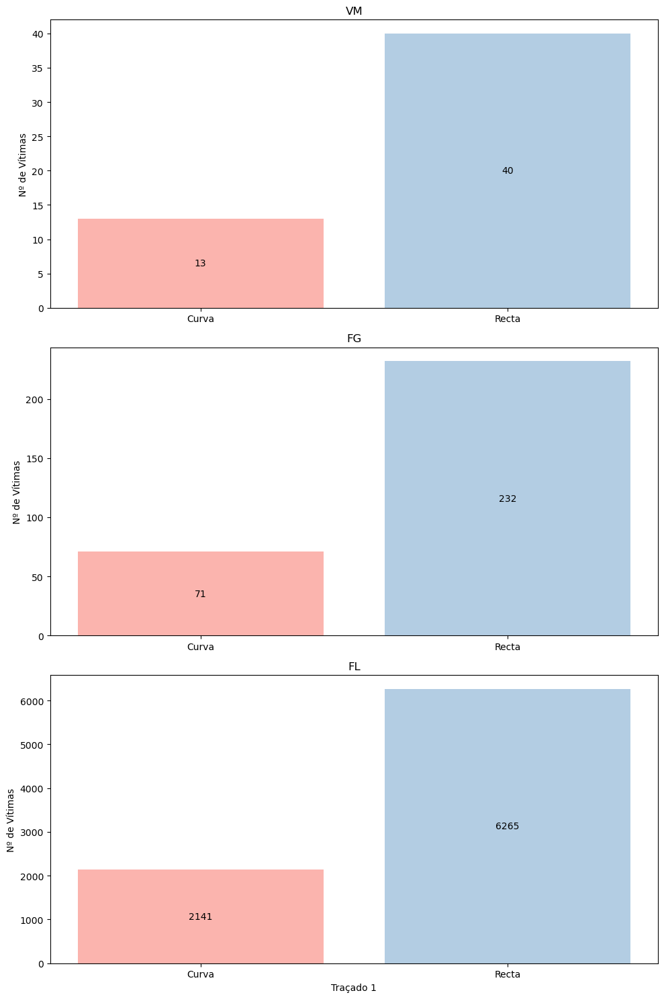

In [57]:
vitimas_por_tracado1 = dataLisboa.groupby('Traçado 1')[['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']].sum()

paleta_cores = sns.color_palette("Pastel1", n_colors=len(vitimas_por_tracado1))

fig, axes = plt.subplots(3, 1, figsize=(10, 15))

tipos = ['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']
titulos = ['VM', 'FG', 'FL']

for i, tipo in enumerate(tipos):
    bars = axes[i].bar(vitimas_por_tracado1.index, vitimas_por_tracado1[tipo], color=paleta_cores)
    
    axes[i].set_title(titulos[i])  
    axes[i].set_ylabel('Nº de Vítimas')
    
    for bar in bars:
        altura = bar.get_height()
        axes[i].annotate(f'{int(altura)}',  
                         xy=(bar.get_x() + bar.get_width() / 2, altura / 2),  
                         ha='center', va='center', fontsize=10, color='black')
    
    if i == len(tipos) - 1:
        axes[i].set_xlabel('Traçado 1')

plt.tight_layout()
plt.show()

##### Traçado 2

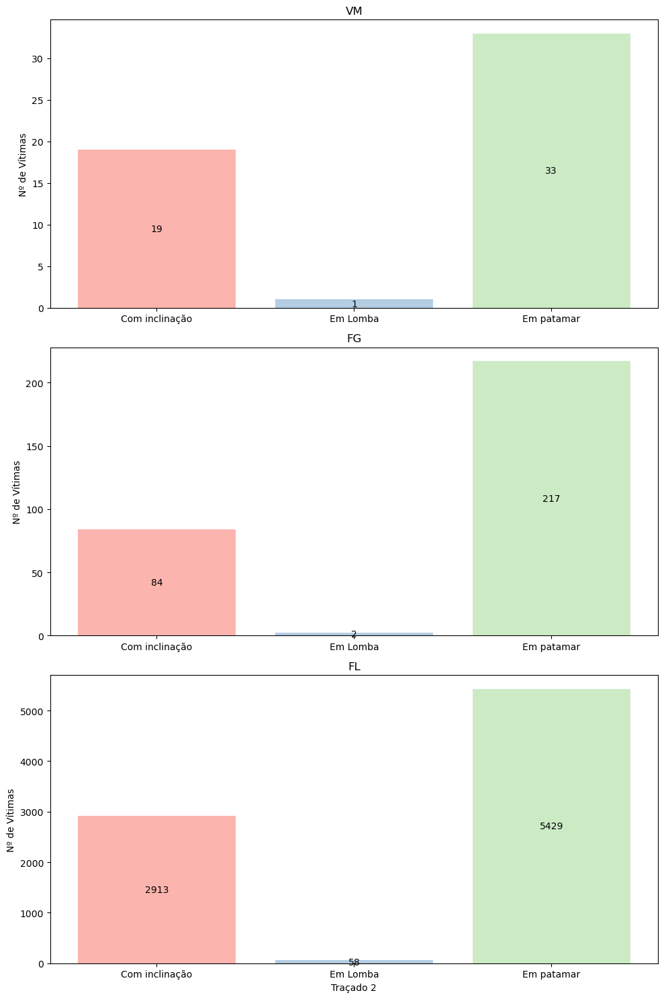

In [58]:
vitimas_por_tracado2 = dataLisboa.groupby('Traçado 2')[['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']].sum()

paleta_cores = sns.color_palette("Pastel1", n_colors=len(vitimas_por_tracado2))

fig, axes = plt.subplots(3, 1, figsize=(10, 15))

tipos = ['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']
titulos = ['VM', 'FG', 'FL']

for i, tipo in enumerate(tipos):
    bars = axes[i].bar(vitimas_por_tracado2.index, vitimas_por_tracado2[tipo], color=paleta_cores)
    
    axes[i].set_title(titulos[i]) 
    axes[i].set_ylabel('Nº de Vítimas')
    
    for bar in bars:
        altura = bar.get_height()
        axes[i].annotate(f'{int(altura)}', 
                         xy=(bar.get_x() + bar.get_width() / 2, altura / 2), 
                         ha='center', va='center', fontsize=10, color='black') 
    
    if i == len(tipos) - 1:
        axes[i].set_xlabel('Traçado 2')

plt.tight_layout()
plt.show()

##### Traçado 3

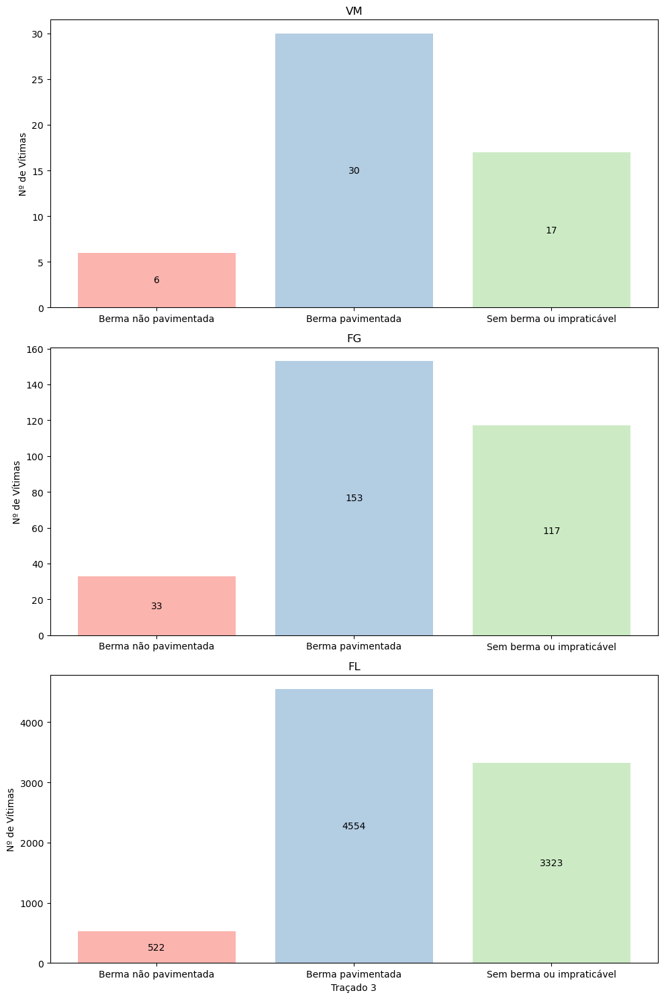

In [59]:
vitimas_por_tracado3 = dataLisboa.groupby('Traçado 3')[['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']].sum()

# Gerar uma paleta de cores com seaborn
paleta_cores = sns.color_palette("Pastel1", n_colors=len(vitimas_por_tracado3))

fig, axes = plt.subplots(3, 1, figsize=(10, 15))

# Dados para os gráficos
tipos = ['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']
titulos = ['VM', 'FG', 'FL']

for i, tipo in enumerate(tipos):
    # Criar as barras com as cores da paleta
    bars = axes[i].bar(vitimas_por_tracado3.index, vitimas_por_tracado3[tipo], color=paleta_cores)
    
    # Definir o título e os rótulos
    axes[i].set_title(titulos[i])  # Alterar o título para VM, FG e FL
    axes[i].set_ylabel('Nº de Vítimas')
    
    # Adicionar valores absolutos no meio das barras
    for bar in bars:
        altura = bar.get_height()
        axes[i].annotate(f'{int(altura)}',  # Texto da legenda
                         xy=(bar.get_x() + bar.get_width() / 2, altura / 2),  # Coordenadas (centro da barra)
                         ha='center', va='center', fontsize=10, color='black')  # Texto centralizado e preto
    
    if i == len(tipos) - 1:
        axes[i].set_xlabel('Traçado 3')

plt.tight_layout()
plt.show()

##### Traçado 4

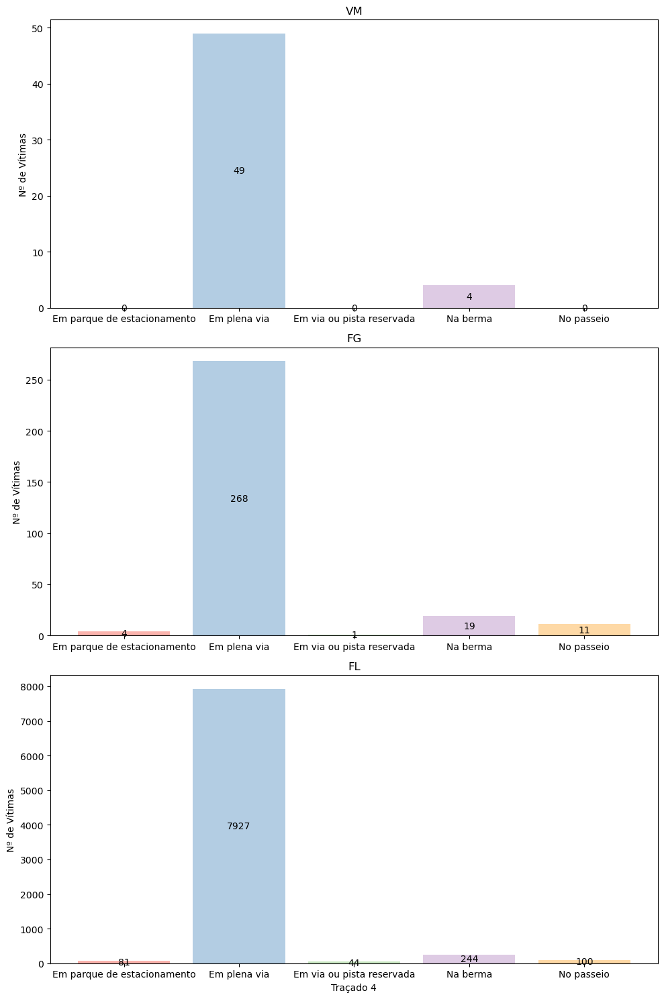

In [60]:
vitimas_por_tracado4 = dataLisboa.groupby('Traçado 4')[['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']].sum()

paleta_cores = sns.color_palette("Pastel1", n_colors=len(vitimas_por_tracado4))

fig, axes = plt.subplots(3, 1, figsize=(10, 15))

tipos = ['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM', 'Num. Feridos ligeiros a 30 dias SUM']
titulos = ['VM', 'FG', 'FL']

for i, tipo in enumerate(tipos):
    bars = axes[i].bar(vitimas_por_tracado4.index, vitimas_por_tracado4[tipo], color=paleta_cores)
    
    axes[i].set_title(titulos[i])  
    axes[i].set_ylabel('Nº de Vítimas')
    
    for bar in bars:
        altura = bar.get_height()
        axes[i].annotate(f'{int(altura)}',  
                         xy=(bar.get_x() + bar.get_width() / 2, altura / 2), 
                         ha='center', va='center', fontsize=10, color='black')
    
    if i == len(tipos) - 1:
        axes[i].set_xlabel('Traçado 4')

plt.tight_layout()
plt.show()

## Análise Lisboa - Acidentes(entender as características dos acidentes em Lisboa)

### Associações - entender se variaveis se condicionam mutuamente ou têm alguma relação

In [61]:
def cramers_v(x, y):
    contingency_table = pd.crosstab(x, y)
    chi2, _, _, _ = chi2_contingency(contingency_table)
    n = contingency_table.sum().sum()
    k = min(contingency_table.shape) - 1
    return np.sqrt(chi2 / (n * k))

categorical_vars = ["Mês","Velocidade geral","Velocidade local", "Dia da Semana", "Características Tecnicas1", "Cond Aderência", 
                    "Reg Circulação1", "Tipos Vias", "Estado Conservação", "Factores Atmosféricos", "Intersecção Vias","Localizações", "Luminosidade",
                   "Marca Via","Natureza","Obstáculos","Sinais Luminosos","Tipo Piso", "Traçado 1", "Traçado 2", "Traçado 3", "Traçado 4", "Via Trânsito"]
results = []

for i in range(len(categorical_vars)):
    for j in range(i + 1, len(categorical_vars)):
        var1 = categorical_vars[i]
        var2 = categorical_vars[j]
        v_cramer = cramers_v(dataLisboa[var1], dataLisboa[var2])
        results.append((var1, var2, v_cramer))

for var1, var2, v in results:
    print(f"V de Cramér entre {var1} e {var2}: {v:.2f}")

V de Cramér entre Mês e Velocidade geral: 0.04
V de Cramér entre Mês e Velocidade local: 0.04
V de Cramér entre Mês e Dia da Semana: 0.06
V de Cramér entre Mês e Características Tecnicas1: 0.05
V de Cramér entre Mês e Cond Aderência: 0.14
V de Cramér entre Mês e Reg Circulação1: 0.04
V de Cramér entre Mês e Tipos Vias: 0.04
V de Cramér entre Mês e Estado Conservação: 0.04
V de Cramér entre Mês e Factores Atmosféricos: 0.14
V de Cramér entre Mês e Intersecção Vias: 0.04
V de Cramér entre Mês e Localizações: 0.05
V de Cramér entre Mês e Luminosidade: 0.18
V de Cramér entre Mês e Marca Via: 0.05
V de Cramér entre Mês e Natureza: 0.05
V de Cramér entre Mês e Obstáculos: 0.04
V de Cramér entre Mês e Sinais Luminosos: 0.04
V de Cramér entre Mês e Tipo Piso: 0.04
V de Cramér entre Mês e Traçado 1: 0.06
V de Cramér entre Mês e Traçado 2: 0.04
V de Cramér entre Mês e Traçado 3: 0.05
V de Cramér entre Mês e Traçado 4: 0.04
V de Cramér entre Mês e Via Trânsito: 0.04
V de Cramér entre Velocidade g

Variáveis que se correlacionam entre si podem ser valiosas para clustering. as que são muito correlcionadas, para evitar multicolinearidade/Redundancia, considera-se apenas uma delas.

### Gráficos 

In [62]:
categorical_vars = ["Mês", "Dia da Semana", "Entidades Fiscalizadoras", "Características Tecnicas1",  "Cond Aderência", "Concelho"]

categorical_vars2 = ["Tipos Vias", "Estado Conservação","Natureza_simples"]

categorical_vars3 = ["Factores Atmosféricos", "Reg Circulação1", "Intersecção Vias", "Localizações", "Luminosidade", "Marca Via"]
                     
categorical_vars4 = ["Obras Arte", "Obstáculos", "Sentidos", "Sinais", "Sinais Luminosos"]

categorical_vars5 = ["Tipo Piso", "Traçado 1", "Traçado 2", "Traçado 3", "Traçado 4", "Via Trânsito"]

# Função para criar gráficos de barras
def plot_bar_charts(data, categorical_vars):
    for i, var in enumerate(categorical_vars):
        plt.figure(figsize=(10, 6)) 
        sns.countplot(data=data, x=var, palette="Set2")
        plt.xticks(rotation=45, ha="right")
        plt.title(f'Frequência de {var}')
        plt.tight_layout()
        plt.show()

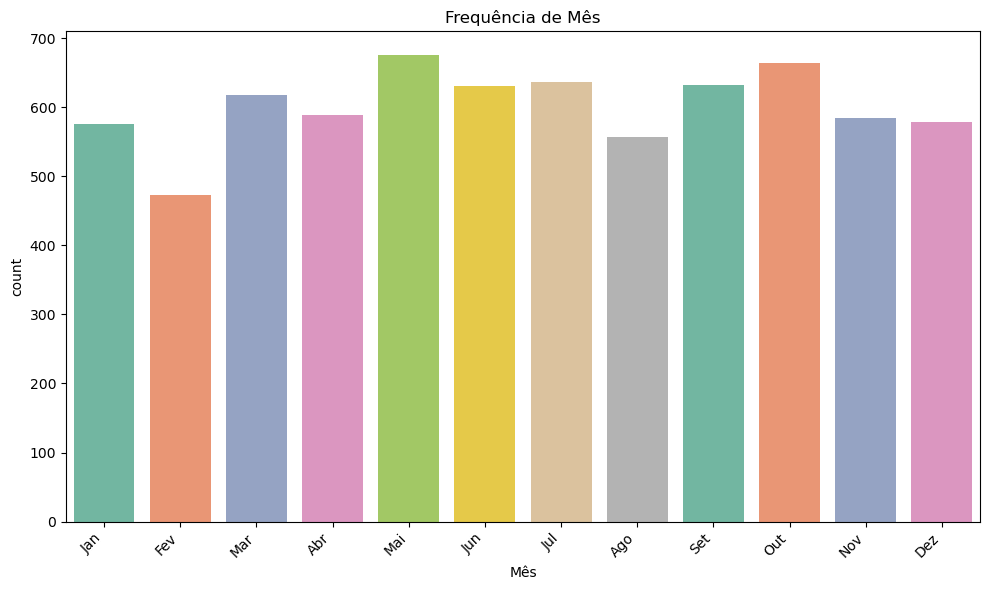

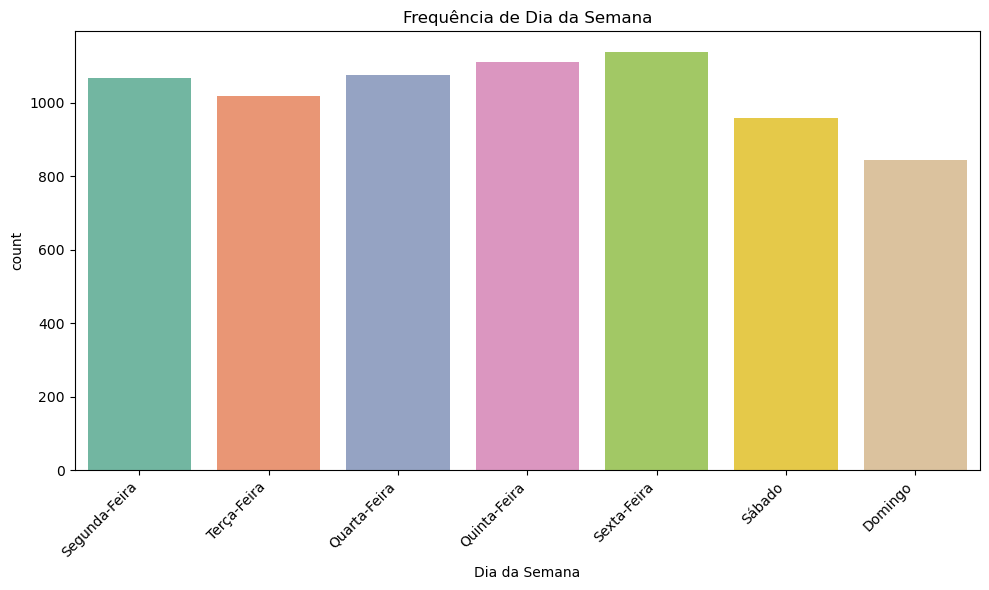

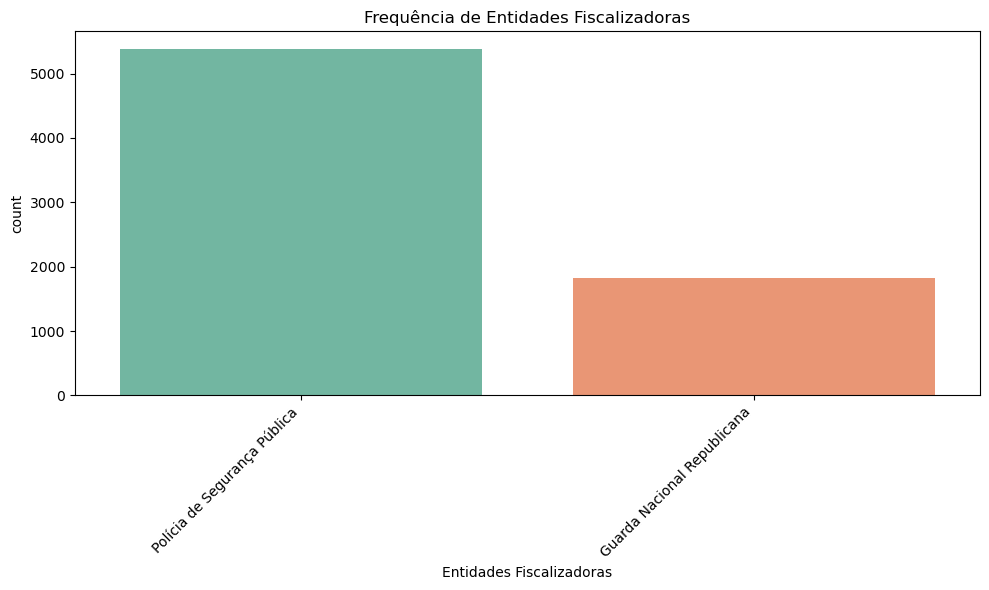

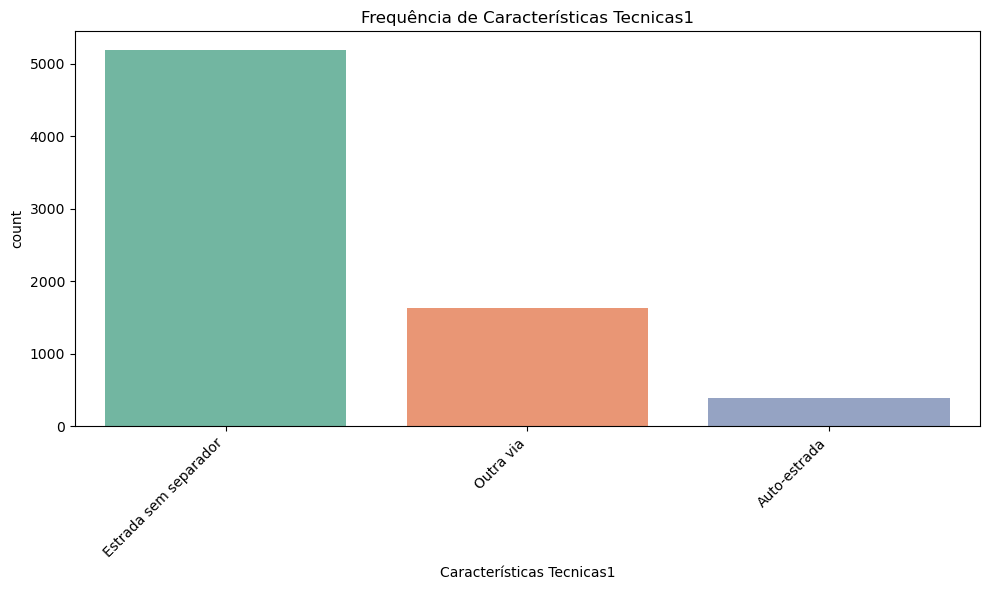

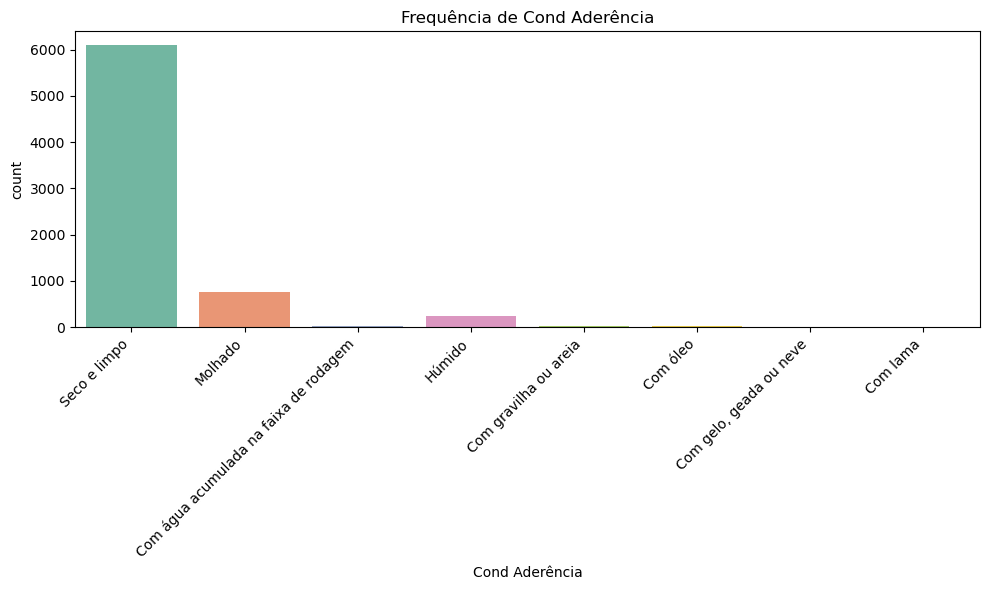

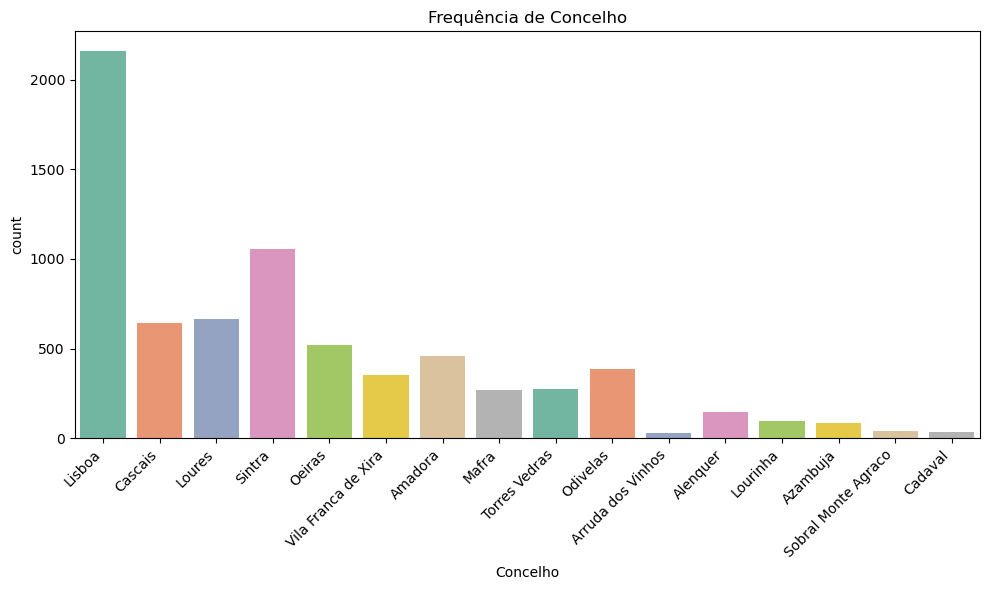

In [63]:
plot_bar_charts(dataLisboa, categorical_vars)

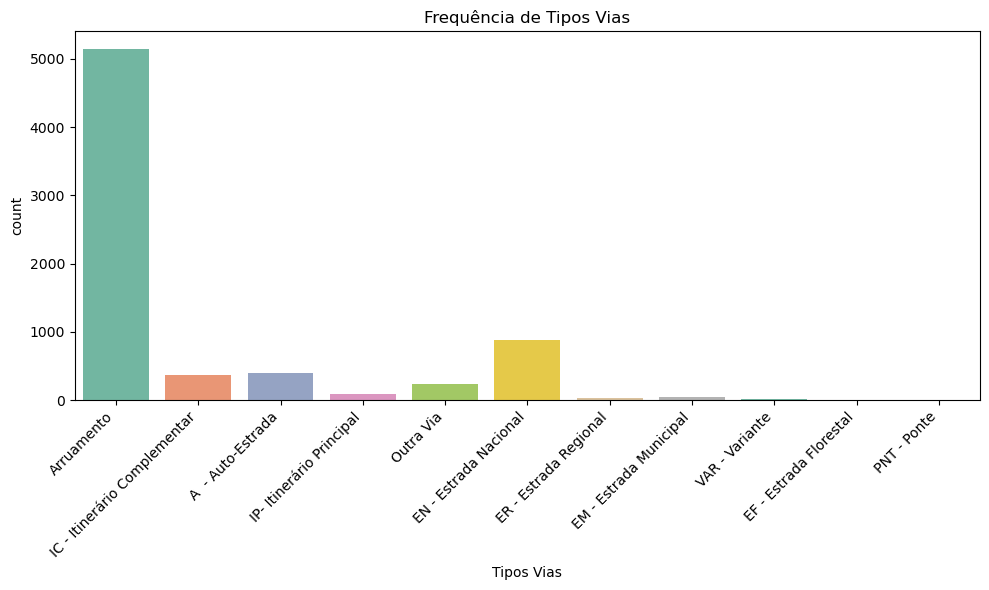

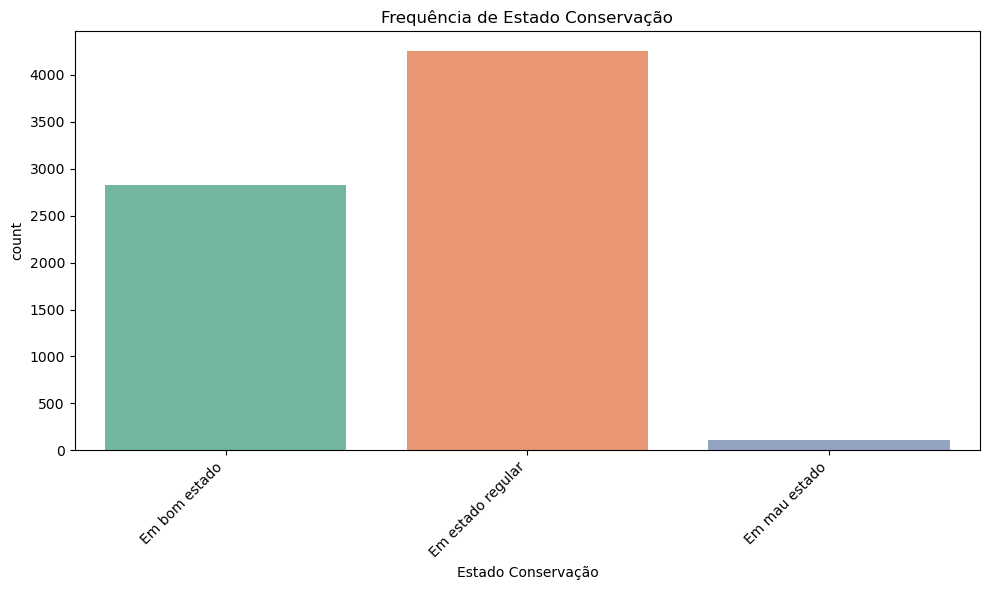

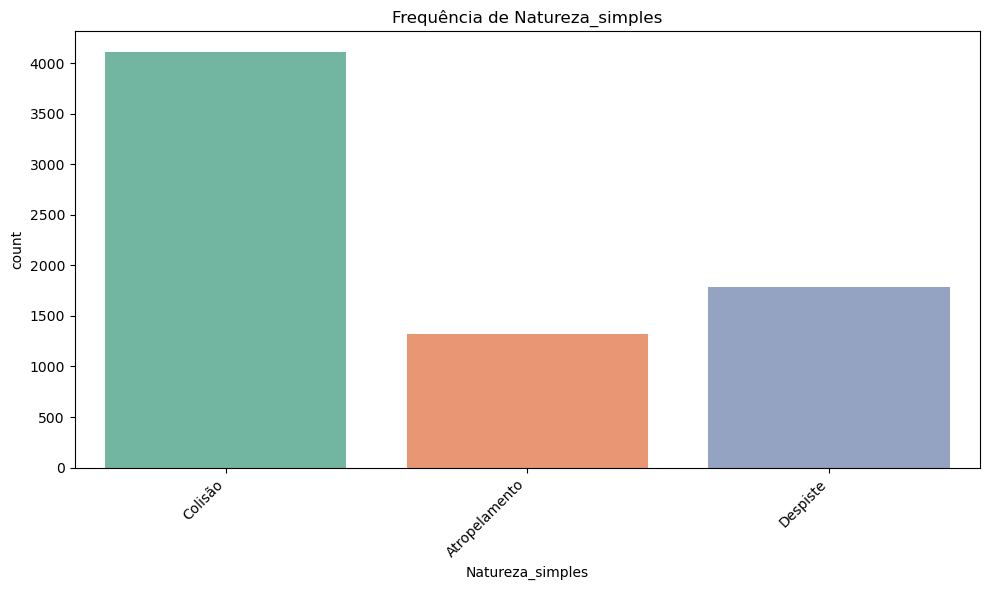

In [64]:
plot_bar_charts(dataLisboa, categorical_vars2)

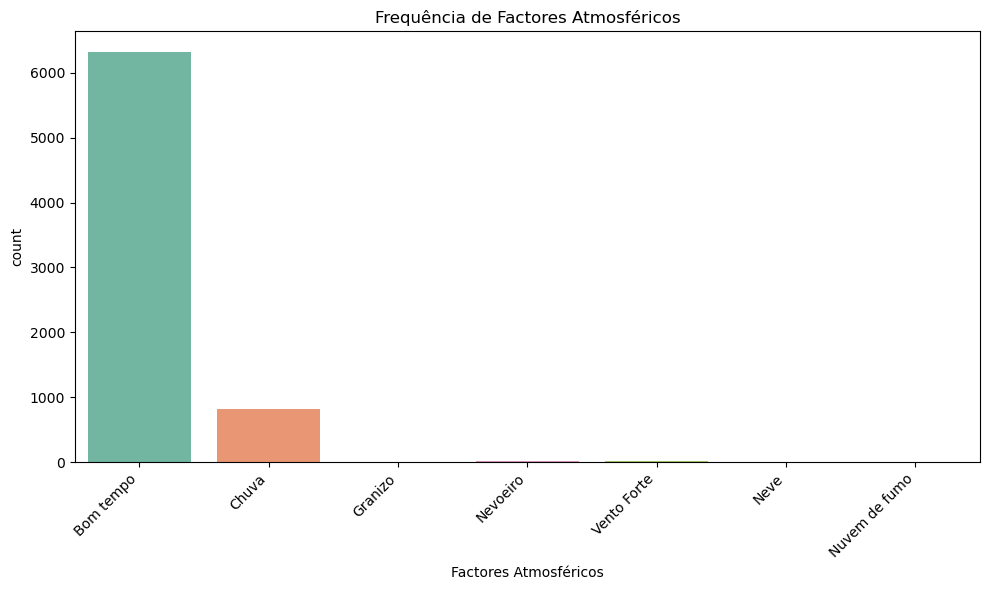

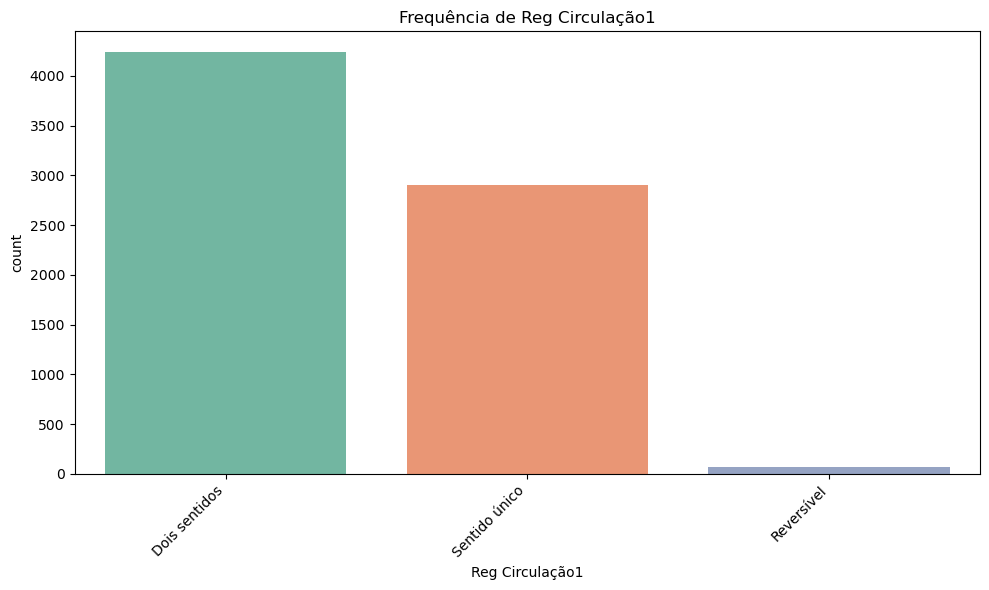

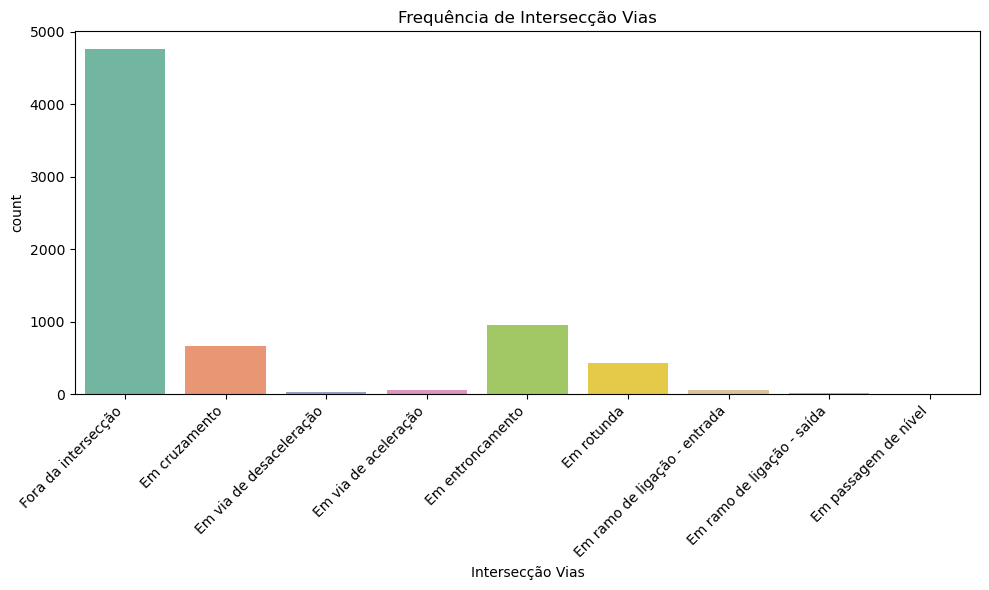

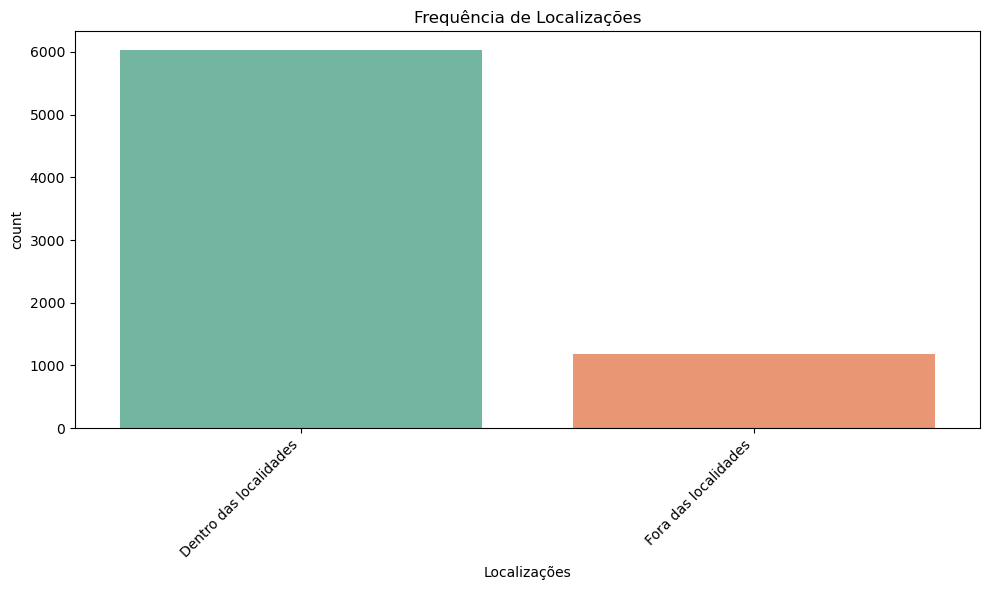

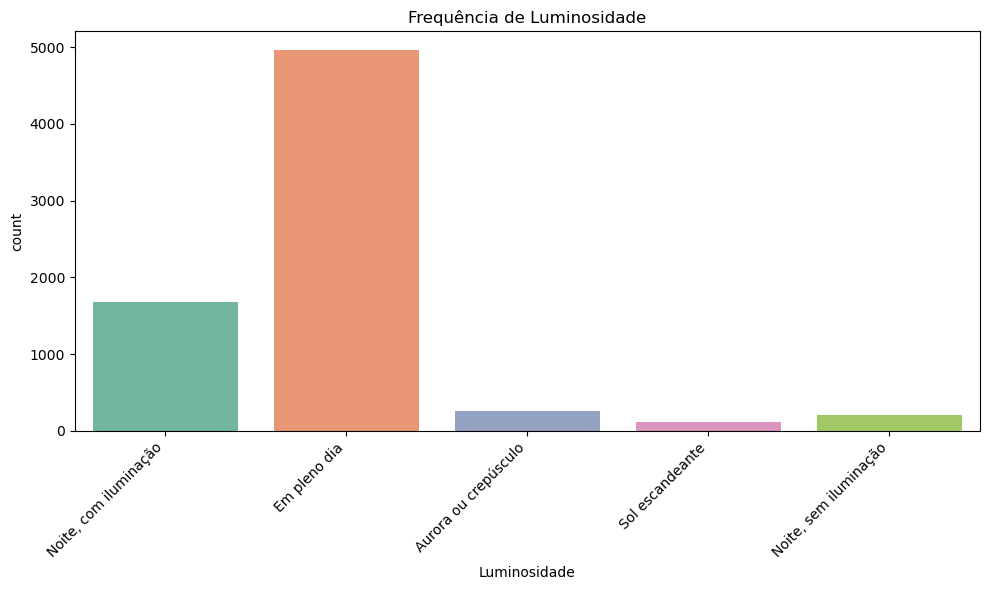

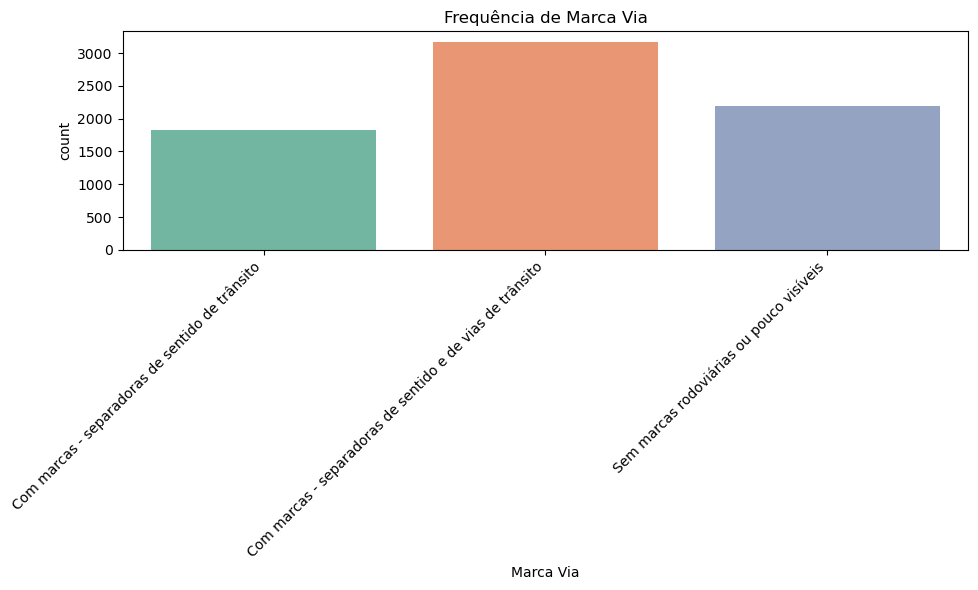

In [65]:
plot_bar_charts(dataLisboa, categorical_vars3)

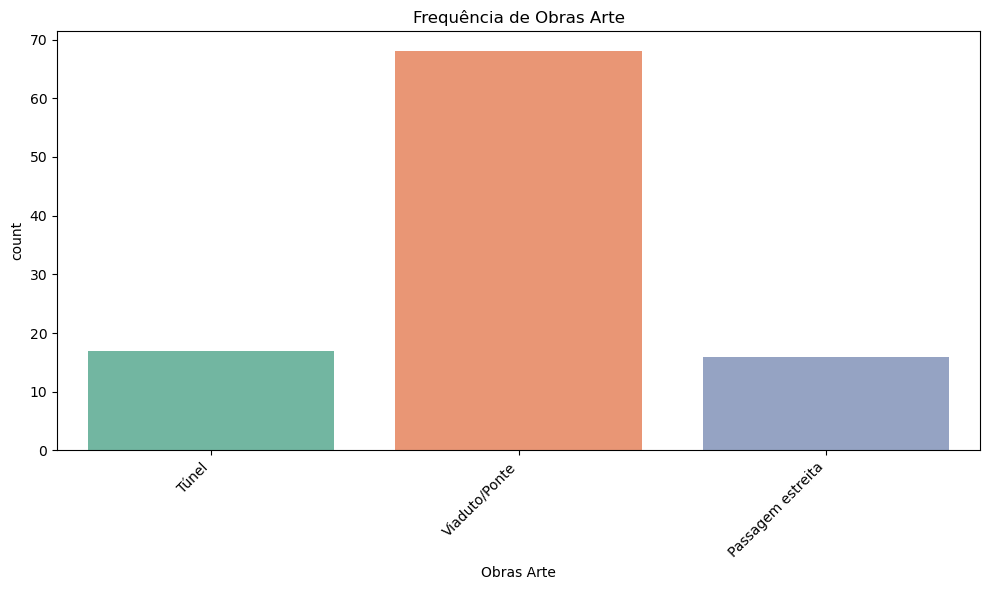

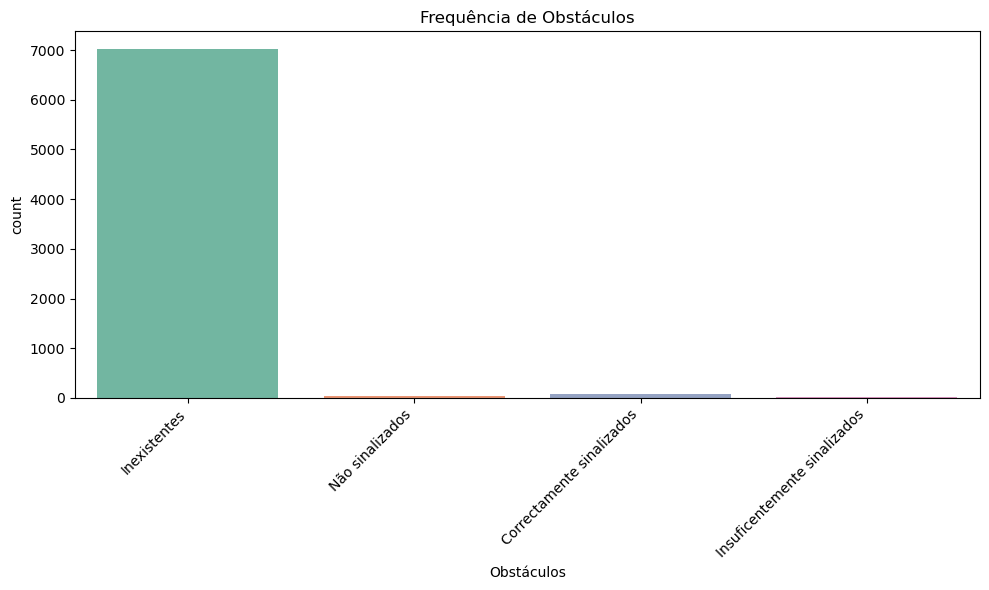

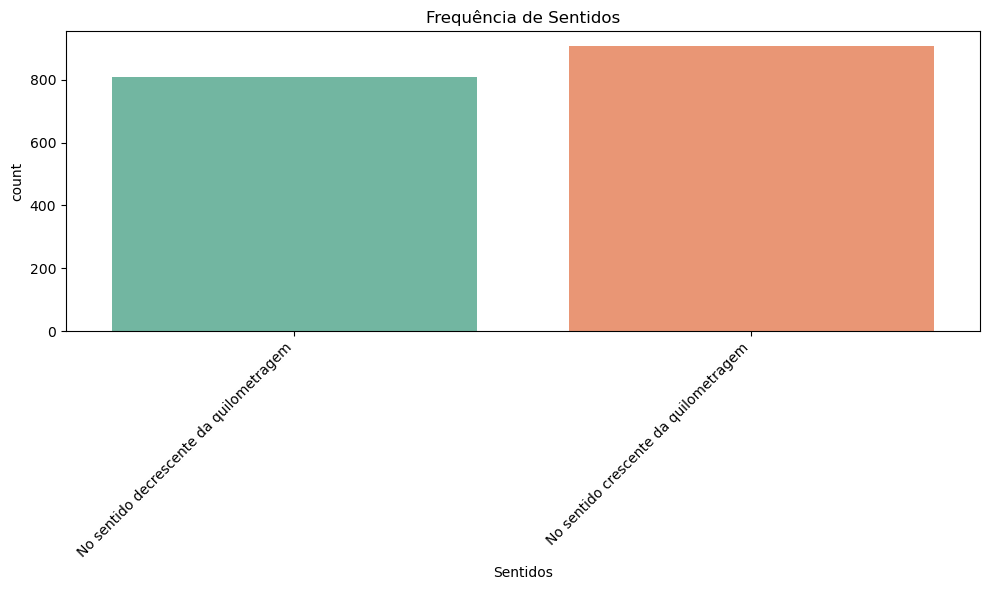

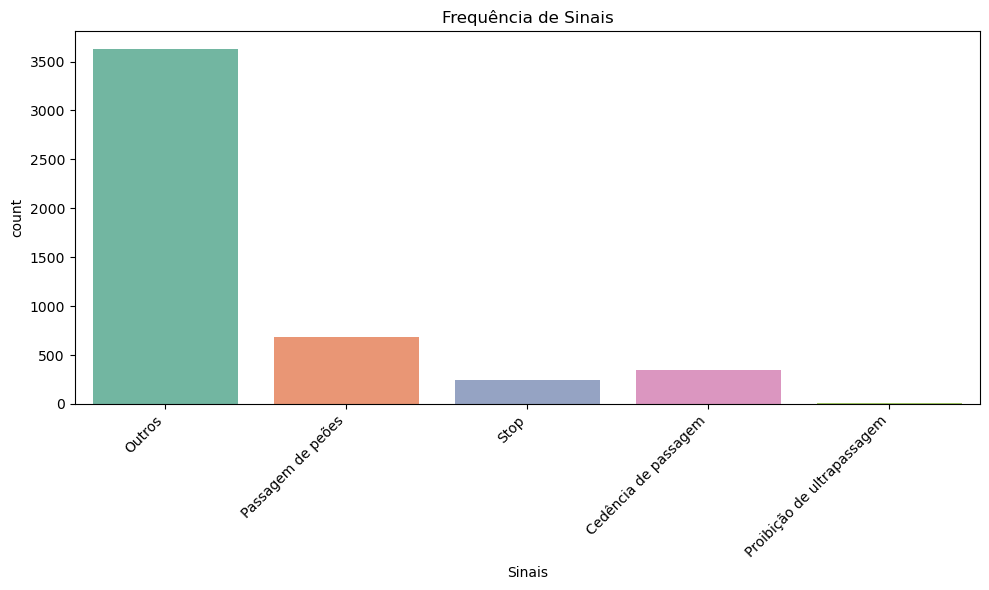

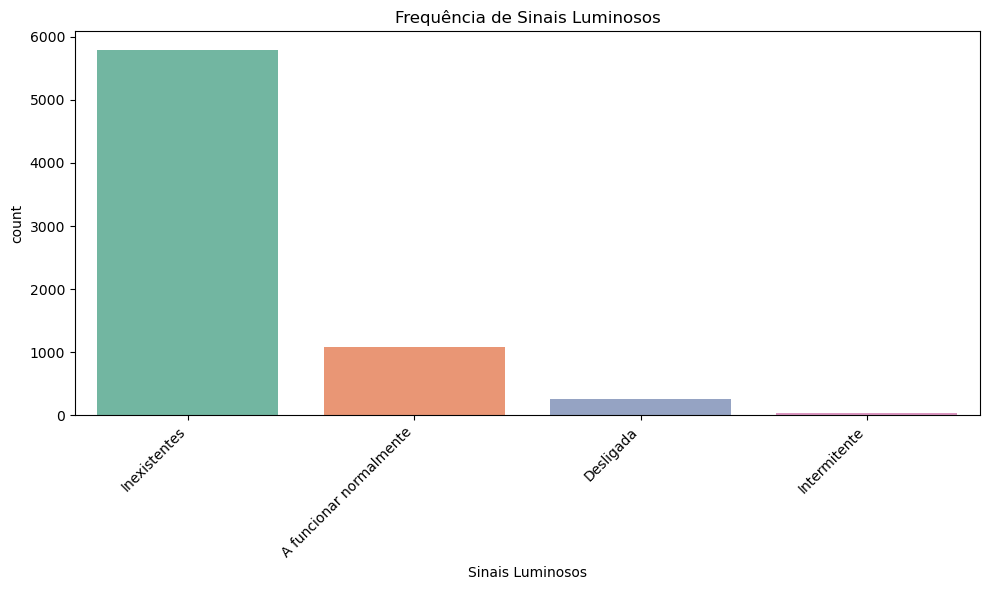

In [66]:
plot_bar_charts(dataLisboa, categorical_vars4)

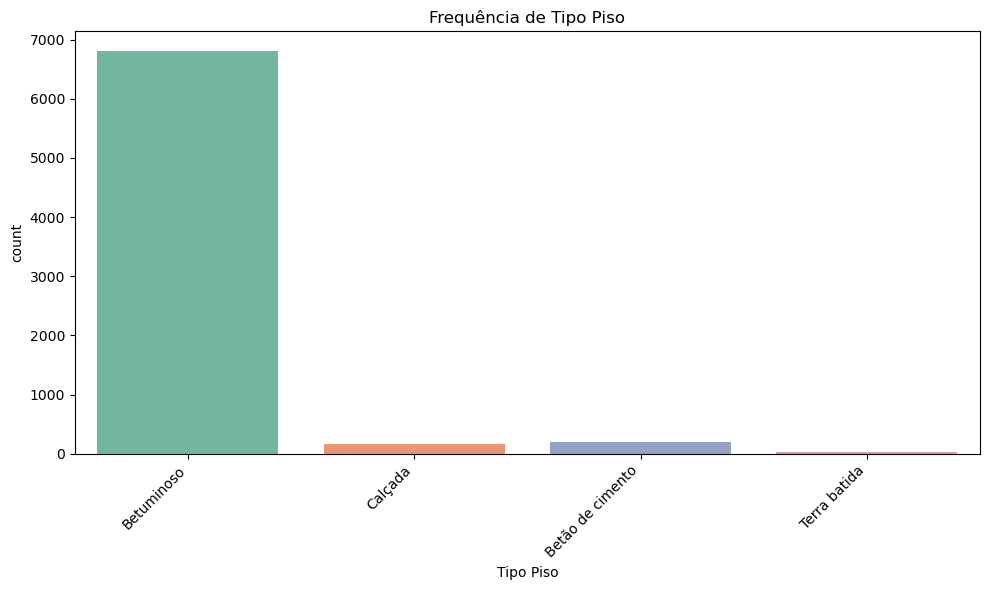

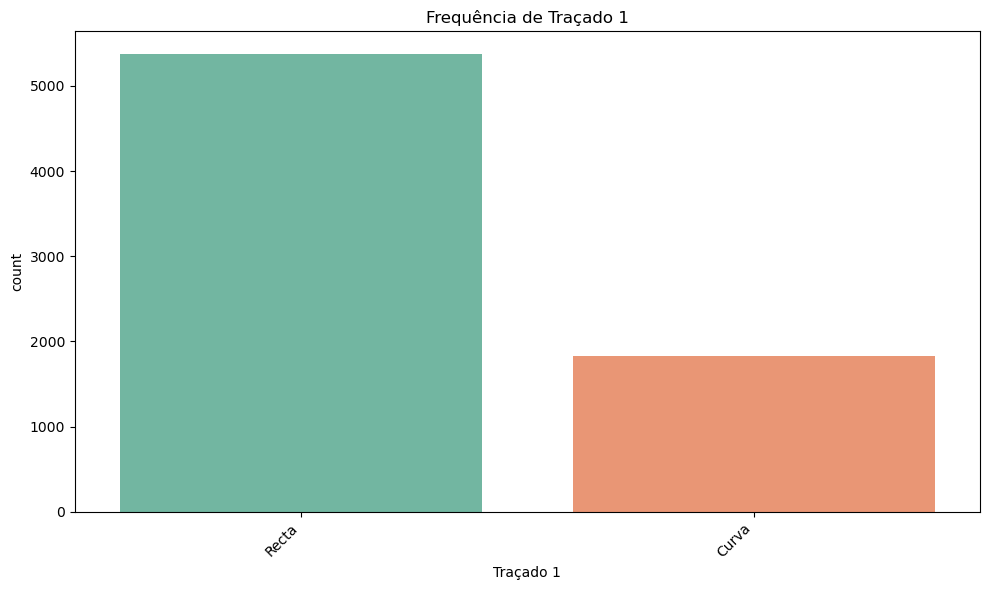

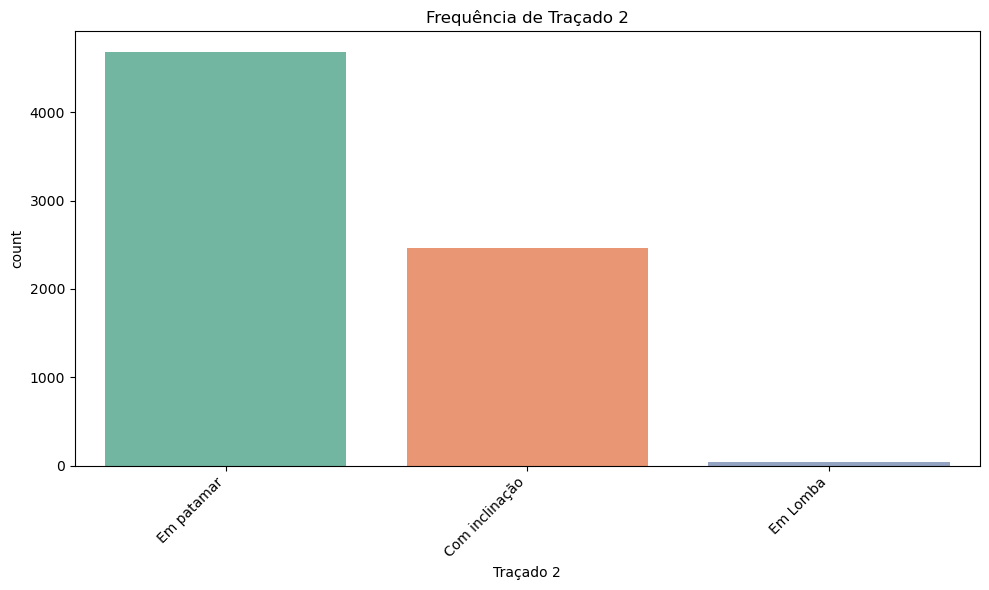

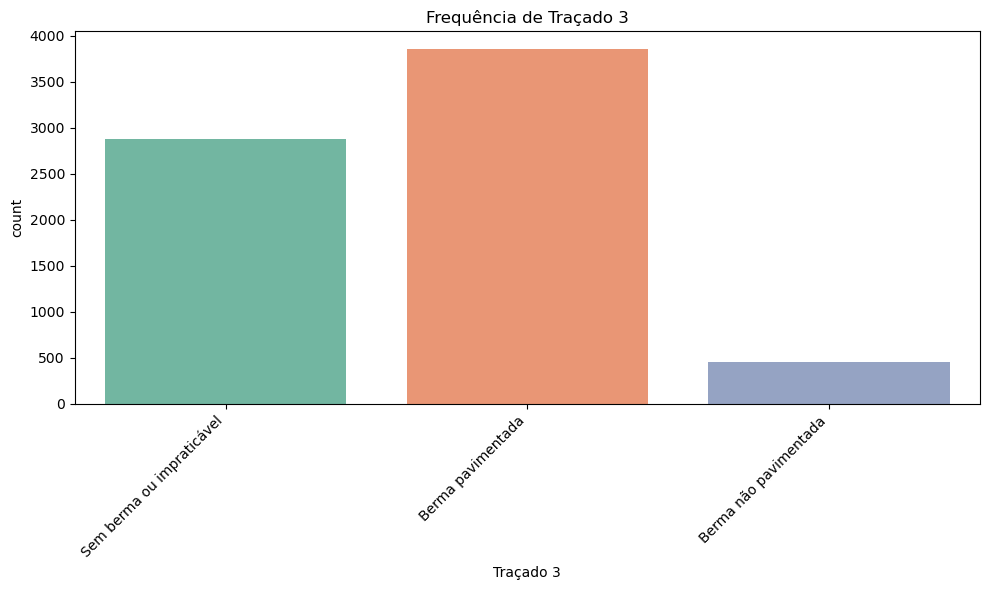

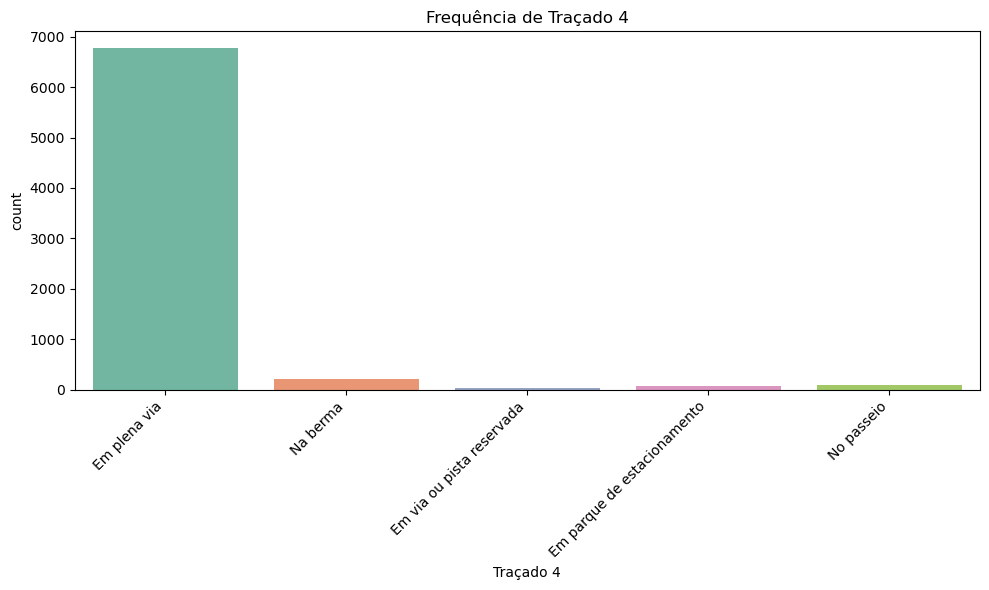

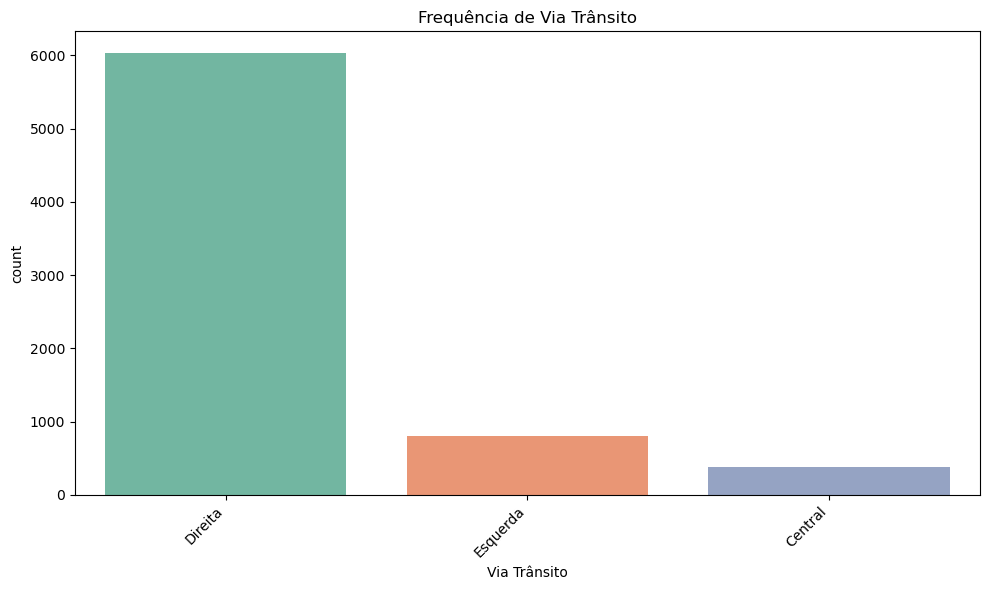

In [67]:
plot_bar_charts(dataLisboa, categorical_vars5)

In [68]:
print(dataLisboa[dataLisboa['Cond Aderência'] == 'Seco e limpo'].shape[0])
print(dataLisboa[dataLisboa['Cond Aderência'] == 'Molhado'].shape[0])
print(dataLisboa[dataLisboa['Cond Aderência'] == 'Húmido'].shape[0])

6090
770
249


In [69]:
print(dataLisboa[dataLisboa['Traçado 1'] == 'Recta'].shape[0])
print(dataLisboa[dataLisboa['Traçado 1'] == 'Curva'].shape[0])
print(dataLisboa[dataLisboa['Traçado 2'] == 'Em patamar'].shape[0])
print(dataLisboa[dataLisboa['Traçado 2'] == 'Com inclinação'].shape[0])
print(dataLisboa[dataLisboa['Traçado 2'] == 'Em Lomba'].shape[0])

print(dataLisboa[dataLisboa['Traçado 3'] == 'Sem berma ou impraticável'].shape[0])
print(dataLisboa[dataLisboa['Traçado 3'] == 'Berma pavimentada'].shape[0])
print(dataLisboa[dataLisboa['Traçado 3'] == 'Berma não pavimentada'].shape[0])

print(dataLisboa[dataLisboa['Traçado 4'] == 'Em plena via'].shape[0])
print(dataLisboa[dataLisboa['Traçado 4'] == 'Na berma'].shape[0])
print(dataLisboa[dataLisboa['Traçado 4'] == 'Em via ou pista reservada'].shape[0])
print(dataLisboa[dataLisboa['Traçado 4'] == 'Em parque de estacionamento'].shape[0])
print(dataLisboa[dataLisboa['Traçado 4'] == 'No passeio'].shape[0])

5373
1824
4681
2466
44
2881
3857
453
6767
217
38
77
89


In [70]:
print(dataLisboa[dataLisboa['Sentidos'] == 'No sentido decrescente da quilometragem'].shape[0])
print(dataLisboa[dataLisboa['Sentidos'] == 'No sentido crescente da quilometragem'].shape[0])

print(dataLisboa[dataLisboa['Sinais'] == 'Outros'].shape[0])
print(dataLisboa[dataLisboa['Sinais'] == 'Passagem de peões'].shape[0])
print(dataLisboa[dataLisboa['Sinais'] == 'Stop'].shape[0])
print(dataLisboa[dataLisboa['Sinais'] == 'Cedência de passagem'].shape[0])
print(dataLisboa[dataLisboa['Sinais'] == 'Proibição de ultrapassagem'].shape[0])

print(dataLisboa[dataLisboa['Sinais Luminosos'] == 'Inexistentes'].shape[0])
print(dataLisboa[dataLisboa['Sinais Luminosos'] == 'A funcionar normalmente'].shape[0])
print(dataLisboa[dataLisboa['Sinais Luminosos'] == 'Desligada'].shape[0])
print(dataLisboa[dataLisboa['Sinais Luminosos'] == 'Intermitente'].shape[0])

808
909
3627
684
249
350
11
5794
1087
254
40


In [71]:
acidentes_com_mortos = dataLisboa[dataLisboa['Num. Mortos a 30 dias SUM'] > 0]
acidentes_com_feridos_graves = dataLisboa[dataLisboa['Num. Feridos graves a 30 dias SUM'] > 0]
acidentes_com_feridos_ligeiros = dataLisboa[dataLisboa['Num. Feridos ligeiros a 30 dias SUM'] > 0]

# Gráfico para Mortos
fig_mortos = px.scatter_mapbox(
    acidentes_com_mortos,
    lat='Latitude GPS',
    lon='Longitude GPS',
    size='Num. Mortos a 30 dias SUM',  # Tamanho do ponto proporcional ao número de mortos
    color='Num. Mortos a 30 dias SUM',
    size_max=15,
    zoom=12,
    mapbox_style='carto-positron',
    title='Acidentes com Mortos'
)

# Gráfico para Feridos Graves
fig_graves = px.scatter_mapbox(
    acidentes_com_feridos_graves,
    lat='Latitude GPS',
    lon='Longitude GPS',
    size='Num. Feridos graves a 30 dias SUM',  # Tamanho do ponto proporcional ao número de feridos graves
    color='Num. Feridos graves a 30 dias SUM',
    size_max=15,
    zoom=12,
    mapbox_style='carto-positron',
    title='Acidentes com Feridos Graves'
)

# Gráfico para Feridos Ligeiros
fig_ligeiros = px.scatter_mapbox(
    acidentes_com_feridos_ligeiros,
    lat='Latitude GPS',
    lon='Longitude GPS',
    size='Num. Feridos ligeiros a 30 dias SUM',  # Tamanho do ponto proporcional ao número de feridos ligeiros
    color='Num. Feridos ligeiros a 30 dias SUM',
    size_max=15,
    zoom=12,
    mapbox_style='carto-positron',
    title='Acidentes com Feridos Ligeiros'
)

# Mostrar os gráficos
fig_mortos.show()
fig_graves.show()
fig_ligeiros.show()


## Filtrar variáveis escolhidas

In [72]:
dataLisboa = dataLisboa[['Mês', 'Hora','Velocidade geral', 'Velocidade local',
       'Dia da Semana', 'Latitude GPS', 'Longitude GPS',
       'Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM',
       'Num. Feridos ligeiros a 30 dias SUM',
       'Cond Aderência','Tipos Vias','Estado Conservação', 'Factores Atmosféricos',
       'Intersecção Vias', 'Localizações', 'Luminosidade', 'Marca Via',
       'Natureza', 'Tipo Piso', 'Traçado 1', 'Traçado 2', 'Traçado 3',
       'Traçado 4', 'Natureza_simples','V_geral_local_diferentes', 'V_local_categoria', 'acidente_grave','momento_dia']].copy()

In [73]:
dataLisboa.shape

(7212, 29)

## Tratamento de valores omissos

In [74]:
print(dataLisboa.shape)
dataLisboa = dataLisboa.dropna()
print(dataLisboa.shape)

(7212, 29)
(6945, 29)


## Procura de hotspots

In [75]:
lat_long = dataLisboa[["Latitude GPS", "Longitude GPS"]]
X = lat_long.to_numpy()    #converter dataframe com latitude e longitude para array
X_radians = np.radians(X)   #converter latidude e longitude de graus para radianos 
latitude = dataLisboa["Latitude GPS"]
longitude = dataLisboa["Longitude GPS"]

In [76]:
# obter um valor para epsilon em radianos para uma distância(raio) sabendo que o raio da terra é de 6371000 metros aproximadamente
eps = 75/6371000
eps

1.1772092293203579e-05

In [77]:
dbscan_cluster_hotspots = DBSCAN(eps=eps,metric="haversine").fit(X_radians)
dbscan_cluster_hotspots

DBSCAN(eps=1.1772092293203579e-05, metric='haversine')

In [78]:
dataLisboa["clusters"] = dbscan_cluster_hotspots.labels_

In [79]:
dataLisboa["clusters"].value_counts()

clusters
-1      6190
 11       16
 36       12
 20       11
 54       11
        ... 
 71        5
 56        5
 90        5
 58        5
 102       5
Name: count, Length: 116, dtype: int64

In [80]:
px.scatter(x=longitude, y= latitude, color = dataLisboa["clusters"])

In [81]:
#pip install folium

In [82]:
mapa = folium.Map(location=[39, -9.2], zoom_start=12)

marker_cluster = MarkerCluster().add_to(mapa)

for acidente in X:
    folium.Marker(
        location=[acidente[0], acidente[1]],
    ).add_to(marker_cluster)

mapa.save("mapa_acidentes.html")  
mapa  

## Procura e análise de pontos negros


In [83]:
#Criar um DataFrame com os valores dos cluster e a soma de mortos e feridos para dado cluster.
pontos_negros = dataLisboa.groupby('clusters')[['Num. Mortos a 30 dias SUM', 
                                                'Num. Feridos graves a 30 dias SUM', 
                                                'Num. Feridos ligeiros a 30 dias SUM']].sum()
pontos_negros = pontos_negros[pontos_negros.index != -1]

#Atribuir as siglas M, FG e FL as colunas que representam os mortos, os feridos graves e os feridos ligeiros respetivamente.
pontos_negros.columns = ['M', 'FG', 'FL']

# Calcular o IG para cada cluster.
pontos_negros['IG'] = 30*pontos_negros['M'] + 10 * pontos_negros['FG'] + 3 * pontos_negros['FL']

# Registar o numero de acidentes por cluster.
pontos_negros['N'] = dataLisboa.groupby('clusters').size()

In [84]:
# Filtrar os valores de modo a ter apenas aqueles ue tem um IG superior a 12 e mais de 5 acidentes com vitimas.
pontos_negros = pontos_negros[pontos_negros['N'] >= 5]
pontos_negros = pontos_negros[pontos_negros['IG'] > 12]

In [85]:
#Pontos negros organizados pela maior densidade de acidentes.
top_5_hotspots = pontos_negros.sort_values(by='N', ascending=False).head(5).copy() 
print(top_5_hotspots)

          M  FG  FL  IG   N
clusters                   
11        0   0  19  57  16
36        0   0  13  39  12
26        0   0  12  36  11
54        0   0  13  39  11
20        0   0  12  36  11


In [86]:
#Selecionar os 5 clusters com o maior IG
top_5_pontos_negros = pontos_negros.sort_values(by='IG', ascending=False).head(5).copy()  
#Atribuindo o nome 'PN1' a 'PN5' com base na posição dos clusters
top_5_pontos_negros['Nome'] = ['PN' + str(i+1) for i in range(len(top_5_pontos_negros))]

In [87]:
#Pontos negros organizados de acordo com o indice de gravidade.
print(top_5_pontos_negros)

          M  FG  FL  IG   N Nome
clusters                        
105       1   2   7  71   5  PN1
84        1   1   7  61   8  PN2
92        1   0  10  60   7  PN3
11        0   0  19  57  16  PN4
78        1   0   8  54   5  PN5


In [88]:
mapeamento_ig = dict(zip(pontos_negros.index, pontos_negros['IG']))
dataLisboa['IndiceGravidade'] = dataLisboa['clusters'].map(mapeamento_ig)
MPN5 = dataLisboa[dataLisboa['clusters'].isin(top_5_pontos_negros.index)] #5 maiores pontos negros
MN5 = dataLisboa[dataLisboa['clusters'].isin(top_5_hotspots.index)] #5 maiores hotspots
X_M = MPN5[['Latitude GPS', 'Longitude GPS']].to_numpy()
X_N = MN5[['Latitude GPS', 'Longitude GPS']].to_numpy()

In [89]:
mapa_M = folium.Map(location=[38.7, -9.2], zoom_start=12)

marker_cluster = MarkerCluster().add_to(mapa_M)

for acidente in X_M:
    folium.Marker(
        location=[acidente[0], acidente[1]],
    ).add_to(marker_cluster)

mapa_M.save("mapa_M_acidentes.html")  
mapa_M  

In [90]:
mapa_N = folium.Map(location=[38.7, -9.2], zoom_start=12)

marker_cluster = MarkerCluster().add_to(mapa_N)

for acidente in X_N:
    folium.Marker(
        location=[acidente[0], acidente[1]],
    ).add_to(marker_cluster)

mapa_N.save("mapa_N_acidentes.html")  
mapa_N 

## Análise dos clusters

In [91]:
def GraficoEmpilhado(clusters, campo):
    data_top5 = dataLisboa[dataLisboa['clusters'].isin(clusters.index)]

    campo_cluster = data_top5.groupby(['clusters', campo]).size().unstack(fill_value=0)

    campo_cluster_percent = campo_cluster.div(campo_cluster.sum(axis=1), axis=0) * 100
    
    campo_cluster_percent = campo_cluster_percent.loc[clusters.index]
    ax = campo_cluster_percent.plot(kind='bar', stacked=True, figsize=(8, 5))

    ax.set_title(f'Distribuição de {campo} por Hotspot (Cluster)')
    ax.set_xlabel('Hotspot')
    ax.set_ylabel(f'% de {campo}')
    if 'Nome' in clusters.columns:
        ax.set_xticklabels(clusters['Nome'].values)
        ax.set_title(f'Distribuição de {campo} por Ponto Negro (Cluster)')
        ax.set_xlabel('Ponto Negro')


    plt.xticks(rotation=45)
    plt.legend(title=campo, bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.show()

In [92]:
cols = ['Tipos Vias', 'Cond Aderência', 'Factores Atmosféricos', 'Intersecção Vias',
       'Localizações', 'Luminosidade', 'Marca Via',
       'Traçado 1', 'Traçado 2', 'Traçado 3', 'Traçado 4', 'Natureza_simples',
       'V_geral_local_diferentes', 'V_local_categoria', 'acidente_grave',
       'momento_dia']

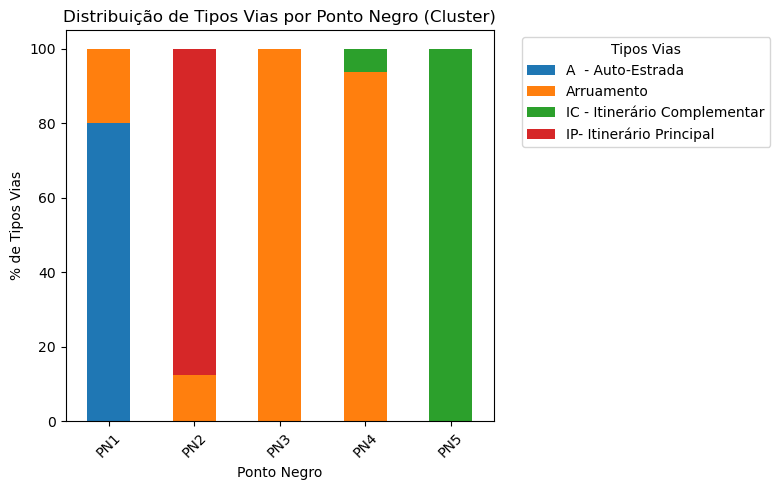

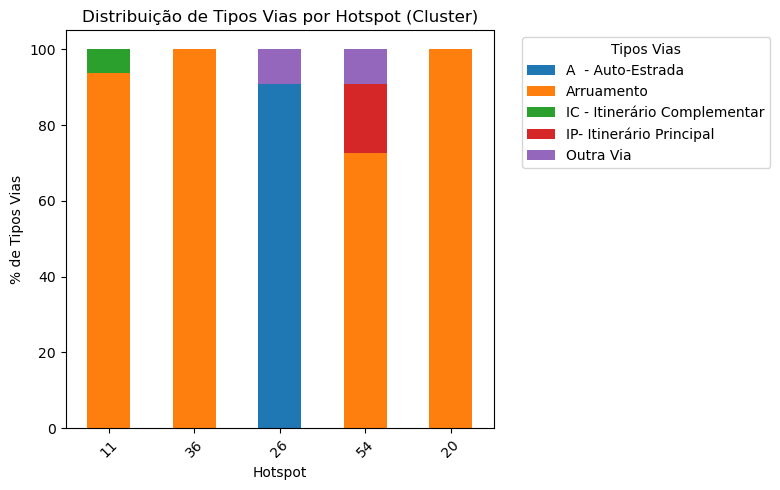

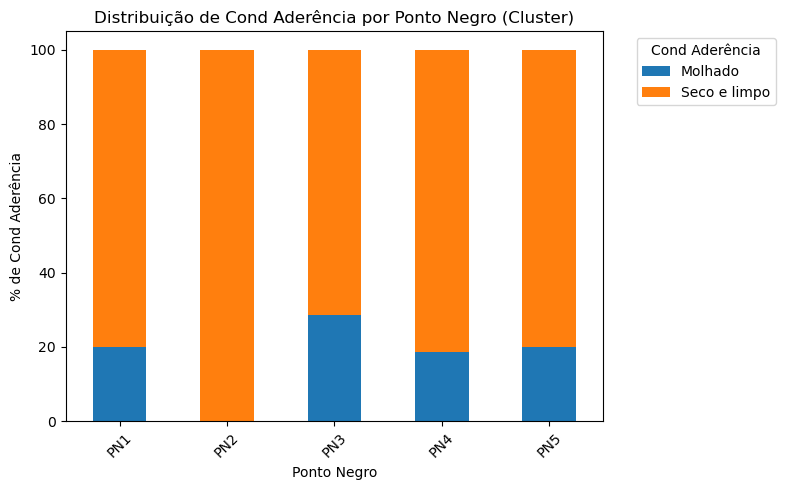

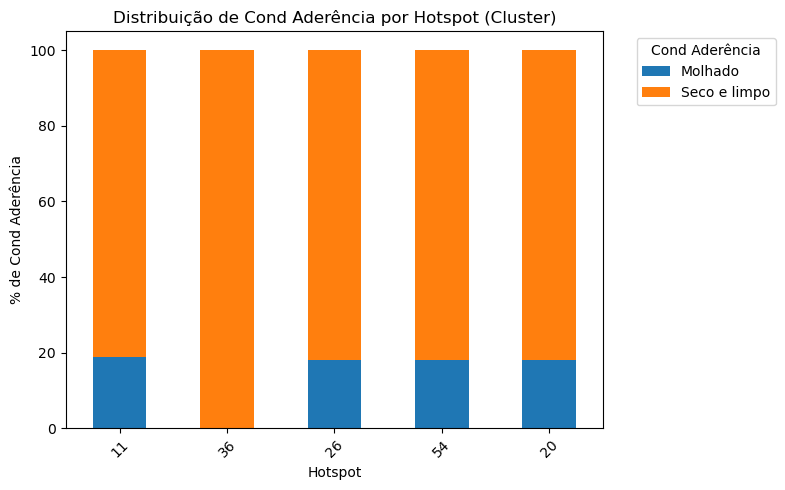

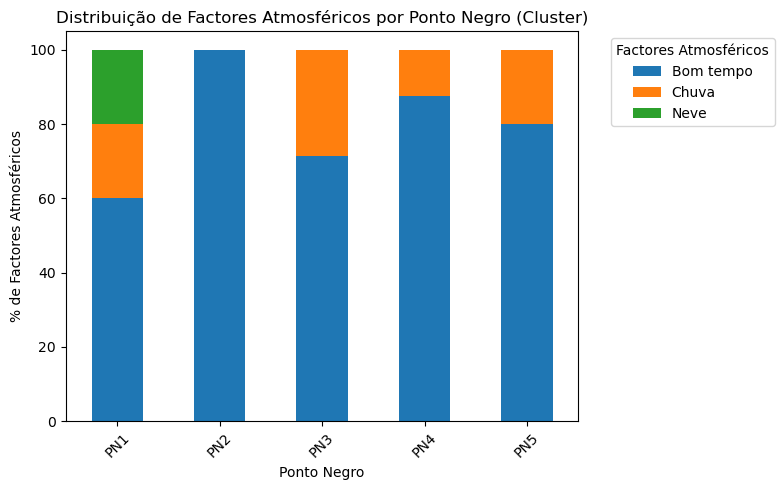

...

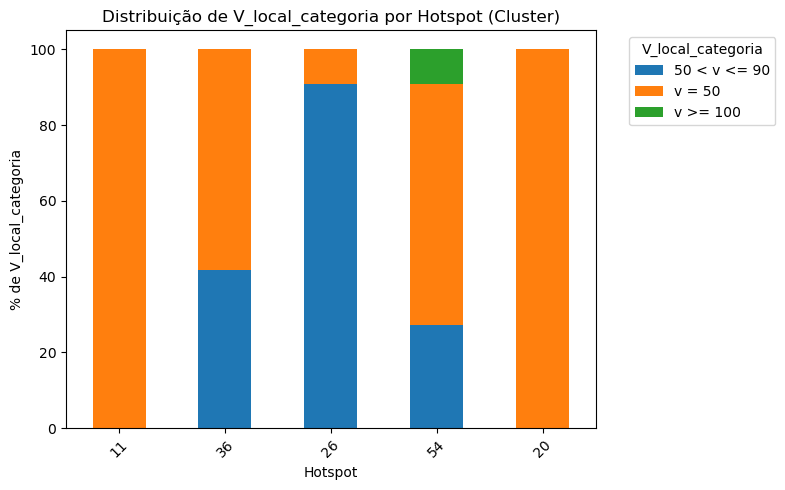

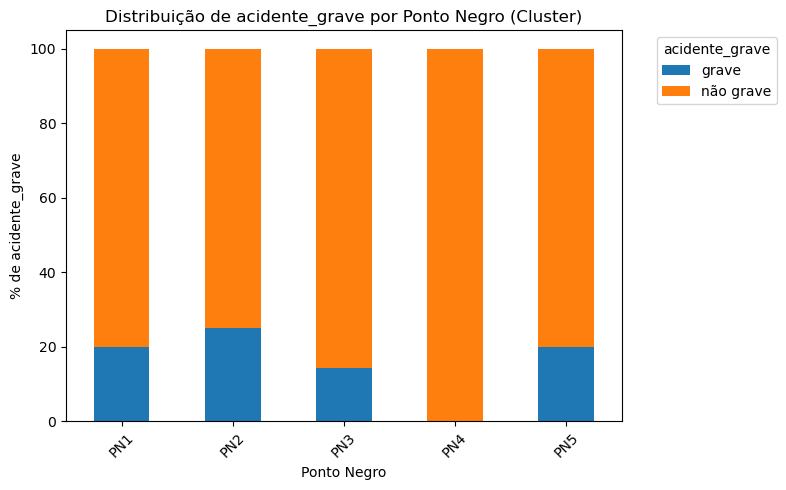

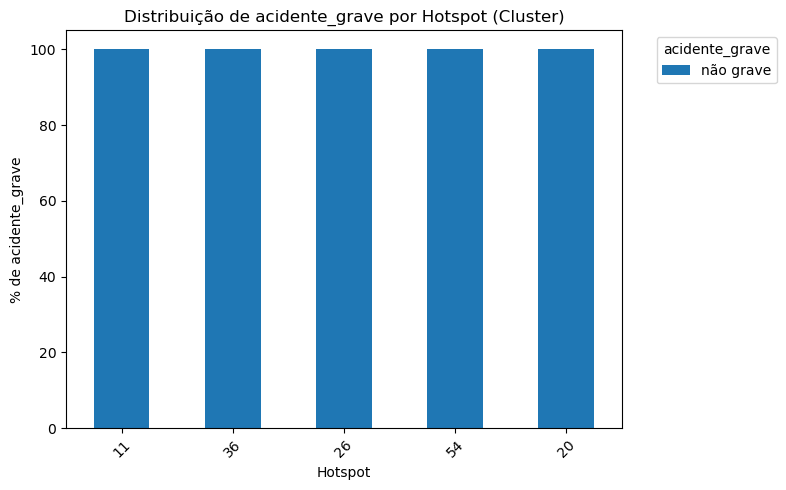

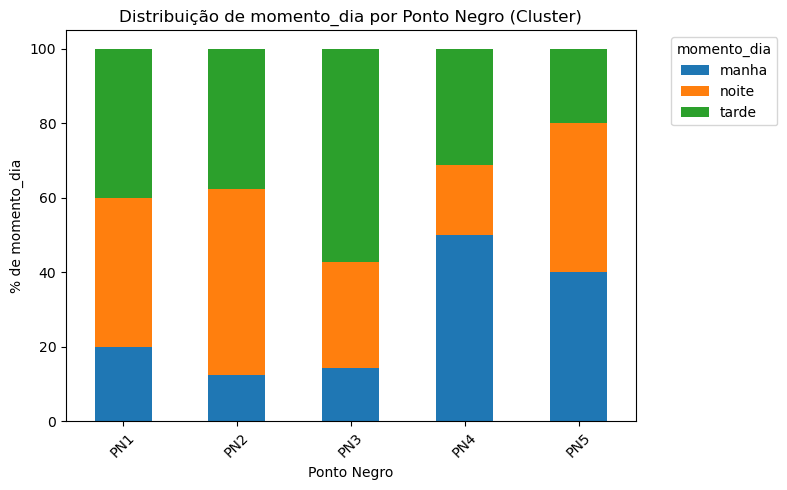

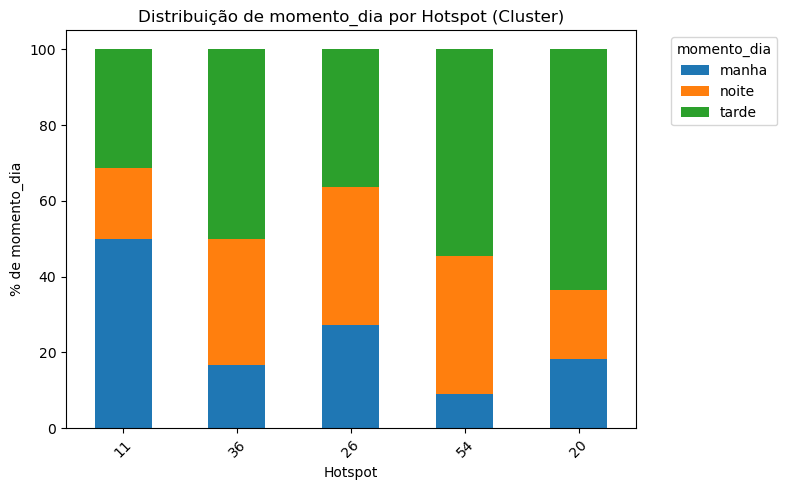

In [93]:
for col in cols:
    GraficoEmpilhado(top_5_pontos_negros, col)
    GraficoEmpilhado(top_5_hotspots, col)
    print()

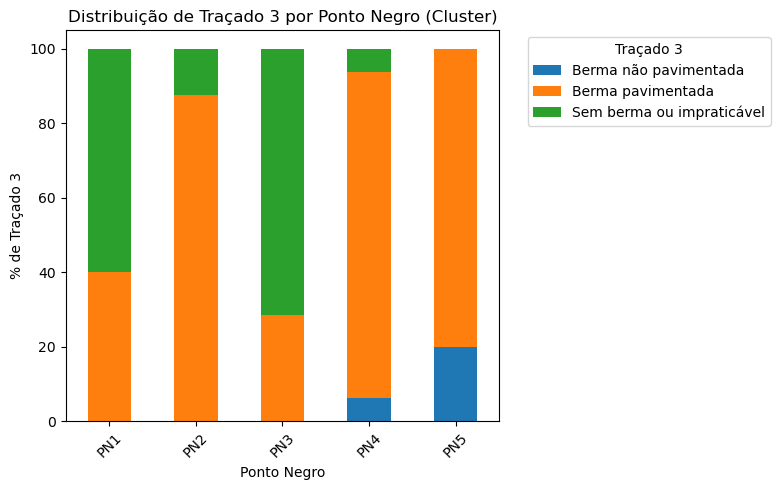

None


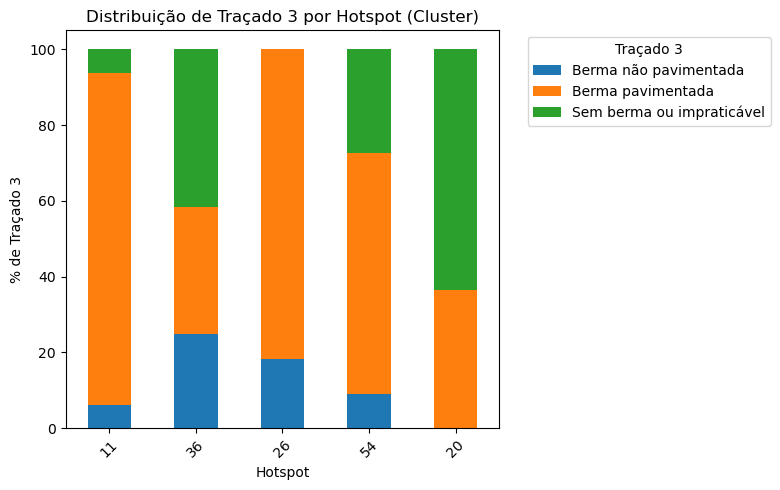

None


In [94]:
print(GraficoEmpilhado(top_5_pontos_negros, "Traçado 3"))
print(GraficoEmpilhado(top_5_hotspots, "Traçado 3"))

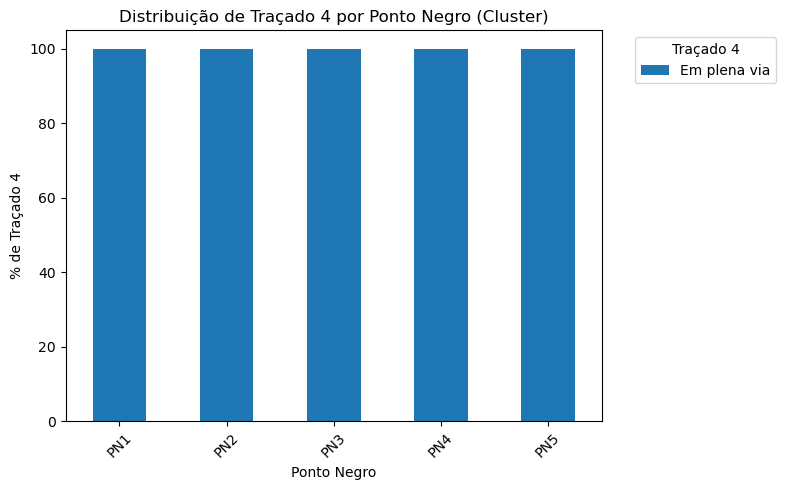

None


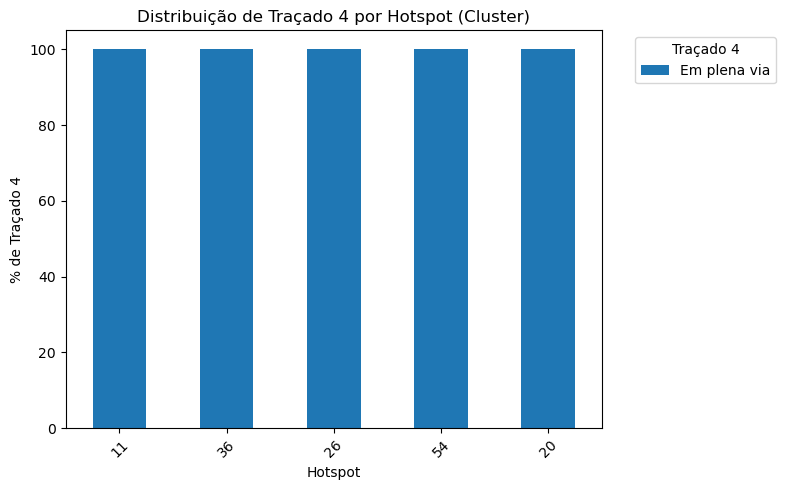

None


In [95]:
print(GraficoEmpilhado(top_5_pontos_negros, "Traçado 4"))
print(GraficoEmpilhado(top_5_hotspots, "Traçado 4"))

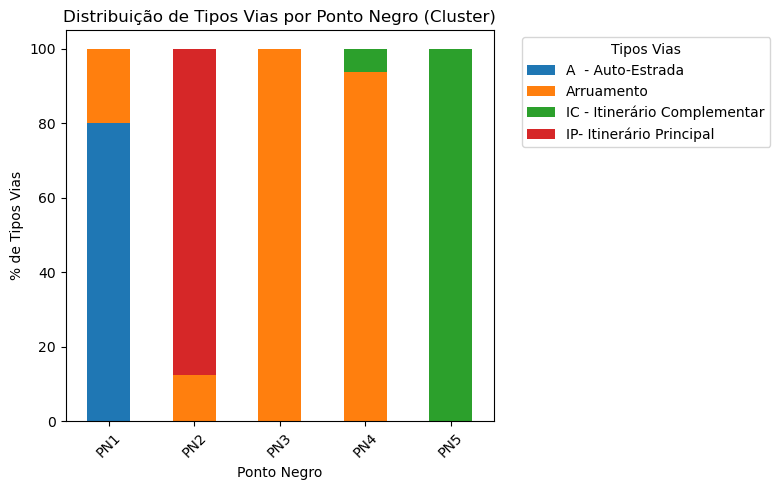

None


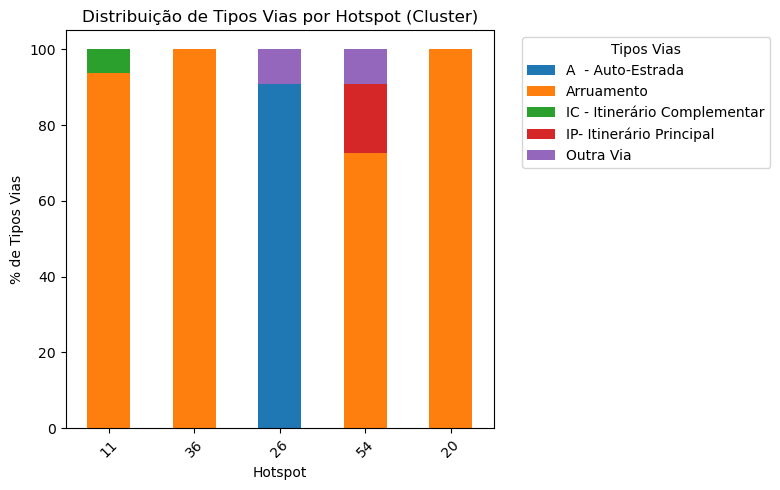

None


In [96]:
print(GraficoEmpilhado(top_5_pontos_negros, "Tipos Vias"))
print(GraficoEmpilhado(top_5_hotspots, "Tipos Vias"))

In [97]:
MPN5

,Mês,Hora,Velocidade geral,Velocidade local,Dia da Semana,Latitude GPS,Longitude GPS,Num. Mortos a 30 dias SUM,Num. Feridos graves a 30 dias SUM,Num. Feridos ligeiros a 30 dias SUM,Cond Aderência,Tipos Vias,Estado Conservação,Factores Atmosféricos,Intersecção Vias,Localizações,Luminosidade,Marca Via,Natureza,Tipo Piso,Traçado 1,Traçado 2,Traçado 3,Traçado 4,Natureza_simples,V_geral_local_diferentes,V_local_categoria,acidente_grave,momento_dia,clusters,IndiceGravidade
563,Jan,23,80,80,Sexta-Feira,38.751306,-9.168947,0,0,1,Seco e limpo,IP- Itinerário Principal,Em estado regular,Bom tempo,Fora da intersecção,Dentro das localidades,"Noite, com iluminação",Com marcas - separadoras de sentido e de vias ...,Colisão traseira com outro veículo em movimento,Betuminoso,Recta,Em patamar,Berma pavimentada,Em plena via,Colisão,Não,50 < v <= 90,não grave,noite,84,61.0
738,Jan,10,50,50,Segunda-Feira,38.759562,-9.199963,0,0,1,Molhado,Arruamento,Em estado regular,Bom tempo,Em rotunda,Dentro das localidades,Em pleno dia,Com marcas - separadoras de sentido e de vias ...,Despiste com dispositivo de retenção,Betuminoso,Curva,Em patamar,Berma pavimentada,Em plena via,Despiste,Não,v = 50,não grave,manha,11,57.0
3514,Fev,21,100,100,Quarta-Feira,38.752750,-9.170040,1,0,0,Seco e limpo,IP- Itinerário Principal,Em bom estado,Bom tempo,Fora da intersecção,Dentro das localidades,"Noite, com iluminação",Com marcas - separadoras de sentido e de vias ...,Colisão traseira com outro veículo em movimento,Betuminoso,Recta,Com inclinação,Berma pavimentada,Em plena via,Colisão,Não,v >= 100,grave,noite,84,61.0
3520,Fev,2,50,50,Quinta-Feira,38.764998,-9.177163,0,0,1,Seco e limpo,Arruamento,Em bom estado,Bom tempo,Fora da intersecção,Dentro das localidades,"Noite, com iluminação",Com marcas - separadoras de sentido e de vias ...,Colisão lateral com outro veículo em movimento,Betuminoso,Recta,Em patamar,Sem berma ou impraticável,Em plena via,Colisão,Não,v = 50,não grave,noite,92,60.0
5223,Mar,10,50,50,Quarta-Feira,38.759346,-9.200752,0,0,1,Seco e limpo,Arruamento,Em estado regular,Bom tempo,Em rotunda,Dentro das localidades,Em pleno dia,Com marcas - separadoras de sentido e de vias ...,Colisão traseira com outro veículo em movimento,Betuminoso,Curva,Em patamar,Berma pavimentada,Em plena via,Colisão,Não,v = 50,não grave,manha,11,57.0
5311,Mar,8,50,50,Quinta-Feira,38.759460,-9.201237,0,0,1,Seco e limpo,Arruamento,Em bom estado,Bom tempo,Em rotunda,Dentro das localidades,Em pleno dia,Com marcas - separadoras de sentido de trânsito,Colisão lateral com outro veículo em movimento,Betuminoso,Curva,Em patamar,Sem berma ou impraticável,Em plena via,Colisão,Não,v = 50,não grave,manha,11,57.0
7128,Mar,12,50,50,Quarta-Feira,38.759913,-9.199966,0,0,1,Seco e limpo,Arruamento,Em estado regular,Bom tempo,Em rotunda,Dentro das localidades,Em pleno dia,Com marcas - separadoras de sentido e de vias ...,Colisão traseira com outro veículo em movimento,Betuminoso,Recta,Em patamar,Berma pavimentada,Em plena via,Colisão,Não,v = 50,não grave,manha,11,57.0
7635,Mar,21,50,50,Segunda-Feira,38.759894,-9.200028,0,0,1,Seco e limpo,Arruamento,Em bom estado,Bom tempo,Em rotunda,Dentro das localidades,"Noite, com iluminação",Com marcas - separadoras de sentido e de vias ...,Colisão lateral com outro veículo em movimento,Betuminoso,Curva,Em patamar,Berma pavimentada,Em plena via,Colisão,Não,v = 50,não grave,noite,11,57.0
7862,Mar,12,120,120,Quinta-Feira,38.799520,-9.108932,0,0,1,Seco e limpo,A - Auto-Estrada,Em bom estado,Bom tempo,Fora da intersecção,Fora das localidades,Em pleno dia,Com marcas - separadoras de sentido e de vias ...,Colisão lateral com outro veículo em movimento,Betuminoso,Recta,Em patamar,Sem berma ou impraticável,Em plena via,Colisão,Não,v >= 100,não grave,manha,105,71.0
9991,Abr,22,80,80,Quinta-Feira,38.778481,-9.330834,0,0,1,Seco e limpo,IC - Itinerário Complementar,Em estado regular,Bom tempo,Fora da intersecção,Dentro das localidades,"Noite, com iluminação",Com marcas - separadora

## Clustering - perfis de acidentes

In [98]:
#!pip install kmodes

In [99]:
dataLisboa.dtypes

Mês                                    category
Hora                                      int32
Velocidade geral                          int64
Velocidade local                          int64
Dia da Semana                          category
Latitude GPS                            float64
Longitude GPS                           float64
Num. Mortos a 30 dias SUM                 int64
Num. Feridos graves a 30 dias SUM         int64
Num. Feridos ligeiros a 30 dias SUM       int64
Cond Aderência                           object
Tipos Vias                               object
Estado Conservação                       object
Factores Atmosféricos                    object
Intersecção Vias                         object
Localizações                             object
Luminosidade                             object
Marca Via                                object
Natureza                                 object
Tipo Piso                                object
Traçado 1                               

In [100]:
# Escolha das variáveis categóricas
categoricas = [#"Dia da Semana", # vai ser sempre separado
               #"Mês",   # vai ser sempre separado   
               #"Luminosidade",
               #"Factores Atmosféricos",   #raramente separado pouca variabilidade 
               #"Tipo Piso",  # raramente separado pouca variabilidade
               #"Intersecção Vias", 
               "Traçado 1", 
               "Traçado 2", 
               ##"Traçado 3", 
               #"Traçado 4",    #raramente separado pouca variabilidade
               #"Tipos Vias",
               #"Localizações",
               #"Cond Aderência",
               #"Estado Conservação",
               ##"Marca Via",
               "Natureza_simples",
               #"V_geral_local_diferentes",   #poucas observações classe minoritaria nao divide
               #"V_local_categoria",
               #"acidente_grave",   #poucas observações classe minoritaria nao divide
               "momento_dia"
]


X = dataLisboa[categoricas]


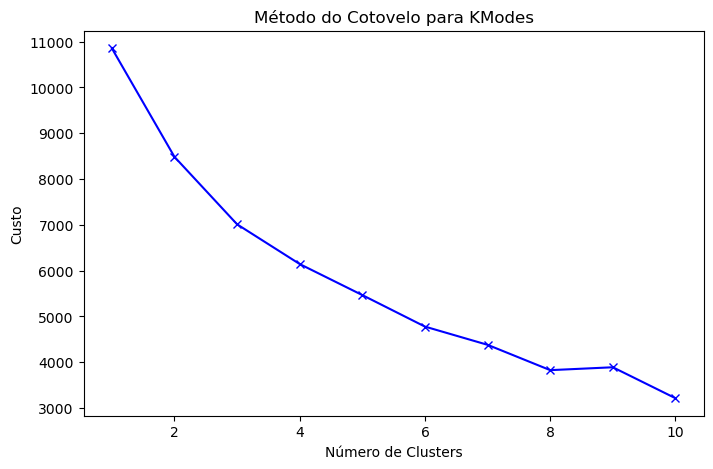

In [101]:
#aplicação do kmodes para procura de clusters
cost = []
k = range(1,11)
for n_clusters in list(k):
    kmodes = KModes(n_clusters=n_clusters, init='Huang', random_state=42)
    kmodes.fit(X)
    cost.append(kmodes.cost_)
    
plt.figure(figsize=(8, 5))
plt.plot(k, cost, 'bx-')
plt.xlabel('Número de Clusters')
plt.ylabel('Custo')
plt.title('Método do Cotovelo para KModes')
plt.show()

In [102]:
kmodes = KModes(n_clusters=8, init='Huang', random_state=42)
clusters = kmodes.fit_predict(X)

dataLisboa['Cluster'] = clusters
print(dataLisboa.groupby('Cluster').size())

Cluster
0    2159
1    1019
2     881
3     576
4     965
5     295
6     540
7     510
dtype: int64


In [103]:
dataLisboa.groupby('Cluster')[categoricas].apply(lambda x: x.mode().iloc[0] if not x.mode().empty else None)

,Traçado 1,Traçado 2,Natureza_simples,momento_dia
Cluster,,,,
0,Recta,Em patamar,Colisão,tarde
1,Recta,Em patamar,Colisão,manha
2,Recta,Com inclinação,Colisão,manha
3,Recta,Em patamar,Despiste,noite
4,Recta,Com inclinação,Colisão,tarde
5,Recta,Em patamar,Atropelamento,manha
6,Curva,Com inclinação,Despiste,manha
7,Recta,Em patamar,Colisão,noite


In [104]:
table = dataLisboa.groupby('Cluster')[['Num. Mortos a 30 dias SUM','Num. Feridos graves a 30 dias SUM','Num. Feridos ligeiros a 30 dias SUM']].sum()

soma_mortos_graves = dataLisboa.groupby('Cluster')[['Num. Mortos a 30 dias SUM', 'Num. Feridos graves a 30 dias SUM']].sum()

# Calcular o número de observações por cluster
tamanho_clusters = dataLisboa.groupby('Cluster').size()

# Calcular a porcentagem de "graves e mortos"
table['gravesmortos%'] = ((soma_mortos_graves['Num. Mortos a 30 dias SUM'] + soma_mortos_graves['Num. Feridos graves a 30 dias SUM']) / (soma_mortos_graves['Num. Mortos a 30 dias SUM'] + soma_mortos_graves['Num. Feridos graves a 30 dias SUM'] + dataLisboa.groupby('Cluster')['Num. Feridos ligeiros a 30 dias SUM'].sum()))*100

table['count'] = tamanho_clusters

table

,Num. Mortos a 30 dias SUM,Num. Feridos graves a 30 dias SUM,Num. Feridos ligeiros a 30 dias SUM,gravesmortos%,count
Cluster,,,,,
0,9,102,2517,4.223744,2159
1,7,33,1228,3.154574,1019
2,10,28,1065,3.445150,881
3,14,45,625,8.625731,576
4,3,29,1141,2.728048,965
5,1,17,304,5.590062,295
6,5,21,612,4.075235,540
7,2,26,617,4.341085,510


In [105]:
dataLisboa['Natureza'].unique()

array(['Colisão frontal',
       'Colisão traseira com outro veículo em movimento',
       'Atropelamento com fuga', 'Colisão com outras situações',
       'Atropelamento de peões',
       'Colisão lateral com outro veículo em movimento',
       'Colisão com fuga', 'Despiste com dispositivo de retenção',
       'Despiste com colisão com veículo imobil. ou obstáculo',
       'Despiste sem dispositivo de retenção', 'Despiste simples',
       'Colisão com veiculo ou obstáculo na faixa de rodagem',
       'Colisão choque em cadeia', 'Despiste com capotamento',
       'Despiste com transposição do dispositivo de retenção lateral',
       'Despiste com fuga', 'Atropelamento de animais'], dtype=object)

In [106]:
tabela = dataLisboa[
    (dataLisboa['Cluster'].isin([0, 1, 2, 4, 7])) & 
    (dataLisboa['Natureza_simples'] == "Colisão")
].groupby(['Cluster', 'Natureza'])['Natureza'].count().reset_index(name='Count')

tabela_pivot = tabela.pivot(index='Natureza', columns='Cluster', values='Count').fillna(0)

cluster_totals = tabela_pivot.sum(axis=0)

tabela_percentagem = round(tabela_pivot.div(cluster_totals, axis=1), 2)

tabela_percentagem

Cluster,0,1,2,4,7
Natureza,,,,,
Colisão choque em cadeia,0.06,0.04,0.05,0.05,0.02
Colisão com fuga,0.04,0.04,0.04,0.05,0.09
Colisão com outras situações,0.16,0.14,0.15,0.14,0.21
Colisão com veiculo ou obstáculo na faixa de rodagem,0.04,0.06,0.05,0.04,0.05
Colisão frontal,0.11,0.09,0.11,0.09,0.10
Colisão lateral com outro veículo em movimento,0.37,0.42,0.38,0.41,0.34
Colisão traseira com outro veículo em movimento,0.22,0.22,0.21,0.22,0.20


In [107]:
tabela = dataLisboa[
    (dataLisboa['Cluster'].isin([3,6])) & 
    (dataLisboa['Natureza_simples'] == "Despiste")
].groupby(['Cluster', 'Natureza'])['Natureza'].count().reset_index(name='Count')

tabela_pivot = tabela.pivot(index='Natureza', columns='Cluster', values='Count').fillna(0)

cluster_totals = tabela_pivot.sum(axis=0)

tabela_percentagem = round(tabela_pivot.div(cluster_totals, axis=1), 2)

tabela_percentagem

Cluster,3,6
Natureza,,
Despiste com capotamento,0.14,0.14
Despiste com colisão com veículo imobil. ou obstáculo,0.17,0.15
Despiste com dispositivo de retenção,0.09,0.11
Despiste com fuga,0.02,0.02
Despiste com transposição do dispositivo de retenção lateral,0.01,0.01
Despiste sem dispositivo de retenção,0.33,0.30
Despiste simples,0.24,0.26


In [108]:
tabela = dataLisboa[
    (dataLisboa['Cluster'].isin([5])) & 
    (dataLisboa['Natureza_simples'] == "Atropelamento")
].groupby(['Cluster', 'Natureza'])['Natureza'].count().reset_index(name='Count')

tabela_pivot = tabela.pivot(index='Natureza', columns='Cluster', values='Count').fillna(0)

cluster_totals = tabela_pivot.sum(axis=0)

tabela_percentagem = round(tabela_pivot.div(cluster_totals, axis=1), 2)

tabela_percentagem

Cluster,5
Natureza,
Atropelamento com fuga,0.11
Atropelamento de peões,0.89


In [109]:
table

,Num. Mortos a 30 dias SUM,Num. Feridos graves a 30 dias SUM,Num. Feridos ligeiros a 30 dias SUM,gravesmortos%,count
Cluster,,,,,
0,9,102,2517,4.223744,2159
1,7,33,1228,3.154574,1019
2,10,28,1065,3.445150,881
3,14,45,625,8.625731,576
4,3,29,1141,2.728048,965
5,1,17,304,5.590062,295
6,5,21,612,4.075235,540
7,2,26,617,4.341085,510


nota-se que no cluster com mais atropelamentos não se observam atropelamentos de animais

In [110]:
tabela = dataLisboa[
    (dataLisboa['Cluster'].isin([0, 4])) & 
    (dataLisboa['momento_dia'] == "tarde")
].groupby(['Cluster', 'Hora'])['Hora'].count().reset_index(name='Count')

tabela_pivot = tabela.pivot(index='Hora', columns='Cluster', values='Count').fillna(0)

cluster_totals = tabela_pivot.sum(axis=0)

tabela_percentagem = round(tabela_pivot.div(cluster_totals, axis=1), 2)

tabela_percentagem

Cluster,0,4
Hora,,
13,0.13,0.12
14,0.12,0.10
15,0.13,0.11
16,0.13,0.13
17,0.17,0.16
18,0.17,0.21
19,0.14,0.16


In [111]:
tabela = dataLisboa[
    (dataLisboa['Cluster'].isin([1,2,5,6])) & 
    (dataLisboa['momento_dia'] == "manha")
].groupby(['Cluster', 'Hora'])['Hora'].count().reset_index(name='Count')

tabela_pivot = tabela.pivot(index='Hora', columns='Cluster', values='Count').fillna(0)

cluster_totals = tabela_pivot.sum(axis=0)

tabela_percentagem = round(tabela_pivot.div(cluster_totals, axis=1), 2)

tabela_percentagem

Cluster,1,2,5,6
Hora,,,,
7,0.13,0.09,0.12,0.14
8,0.19,0.21,0.19,0.16
9,0.18,0.23,0.19,0.19
10,0.16,0.14,0.17,0.18
11,0.14,0.16,0.17,0.19
12,0.20,0.17,0.17,0.15


In [112]:
tabela = dataLisboa[
    (dataLisboa['Cluster'].isin([3,7])) & 
    (dataLisboa['momento_dia'] == "noite")
].groupby(['Cluster', 'Hora'])['Hora'].count().reset_index(name='Count')

tabela_pivot = tabela.pivot(index='Hora', columns='Cluster', values='Count').fillna(0)

cluster_totals = tabela_pivot.sum(axis=0)

tabela_percentagem = round(tabela_pivot.div(cluster_totals, axis=1), 2)

tabela_percentagem

Cluster,3,7
Hora,,
0,0.11,0.09
1,0.06,0.03
2,0.09,0.04
3,0.04,0.02
4,0.04,0.03
5,0.05,0.04
6,0.07,0.05
20,0.21,0.24
21,0.12,0.19


## Similaridade entre os clusters e os pontos negros

In [113]:
moda_pontos_negros = MPN5.groupby('clusters')[['Traçado 1', 'Traçado 2', 'Natureza_simples', 'momento_dia']].agg(lambda x: x.mode()[0])
moda_clusters = dataLisboa.groupby('Cluster')[categoricas].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else None)

In [114]:
combined_data = pd.concat([moda_pontos_negros, moda_clusters])
encoder = OrdinalEncoder()
encoded_data = encoder.fit_transform(combined_data)

encoded_pontos_negros = pd.DataFrame(encoded_data[:len(moda_pontos_negros)], index=moda_pontos_negros.index, columns=moda_pontos_negros.columns)
encoded_clusters = pd.DataFrame(encoded_data[len(moda_pontos_negros):], index=moda_clusters.index, columns=moda_clusters.columns)

#### Distância hamming

In [115]:
def hamming_distance(x, y):
    return np.sum(x != y)

hamming_distances = np.array([[hamming_distance(encoded_pontos_negros.iloc[i], encoded_clusters.iloc[j]) 
                               for j in range(encoded_clusters.shape[0])] 
                              for i in range(encoded_pontos_negros.shape[0])])

hamming_distances_df = pd.DataFrame(hamming_distances, index=moda_pontos_negros.index, columns=moda_clusters.index)
hamming_distances_df

Cluster,0,1,2,3,4,5,6,7
clusters,,,,,,,,
11,2,1,2,3,3,2,2,2
78,2,1,0,3,1,2,2,2
84,1,1,2,1,2,2,4,0
92,2,3,2,3,1,2,3,3
105,1,1,2,1,2,2,4,0


In [116]:
hamming_distances_df.mean(axis=0)

Cluster
0    1.6
1    1.4
2    1.6
3    2.2
4    1.8
5    2.0
6    3.0
7    1.4
dtype: float64

In [117]:
closest_clusters = hamming_distances_df.idxmin(axis=1)
distancias_minimas = hamming_distances_df.min(axis=1)

resultado = pd.DataFrame({
    'Ponto Negro': moda_pontos_negros.index,
    'Cluster Mais Próximo': closest_clusters.values,
    'Distância': distancias_minimas.values
})
resultado

,Ponto Negro,Cluster Mais Próximo,Distância
0,11,1,1
1,78,2,0
2,84,7,0
3,92,4,1
4,105,7,0


#### Distância Jaccard

In [118]:
def jaccard_distance(x, y):
    return 1 - np.mean(jaccard_score(x, y, average=None))  

jaccard_distances = np.array([[jaccard_distance(encoded_pontos_negros.iloc[i], encoded_clusters.iloc[j]) 
                                for j in range(encoded_clusters.shape[0])] 
                               for i in range(encoded_pontos_negros.shape[0])])

jaccard_distances_df = pd.DataFrame(jaccard_distances, index=moda_pontos_negros.index, columns=moda_clusters.index)
jaccard_distances_df

Cluster,0,1,2,3,4,5,6,7
clusters,,,,,,,,
11,0.777778,0.416667,0.666667,0.916667,0.888889,0.666667,0.777778,0.750000
78,0.777778,0.416667,0.000000,0.916667,0.500000,0.666667,0.777778,0.750000
84,0.625000,0.625000,0.750000,0.625000,0.833333,0.750000,1.000000,0.000000
92,0.555556,0.888889,0.722222,0.888889,0.333333,0.722222,0.916667,0.916667
105,0.625000,0.625000,0.750000,0.625000,0.833333,0.750000,1.000000,0.000000


In [119]:
closest_clusters = jaccard_distances_df.idxmin(axis=1)
distancias_minimas = jaccard_distances_df.min(axis=1)

resultado = pd.DataFrame({
    'Ponto Negro': moda_pontos_negros.index,
    'Cluster Mais Próximo': closest_clusters.values,
    'Distância': distancias_minimas.values
})
resultado

,Ponto Negro,Cluster Mais Próximo,Distância
0,11,1,0.416667
1,78,2,0.000000
2,84,7,0.000000
3,92,4,0.333333
4,105,7,0.000000


## Similaridade entre os Clusters e os hotspots

In [120]:
moda_hotspots = MN5.groupby('clusters')[['Traçado 1', 'Traçado 2', 'Natureza_simples', 'momento_dia']].agg(lambda x: x.mode()[0])

In [121]:
combined_data = pd.concat([moda_hotspots, moda_clusters])
encoder = OrdinalEncoder()
encoded_data = encoder.fit_transform(combined_data)

encoded_hotspots = pd.DataFrame(encoded_data[:len(moda_hotspots)], index=moda_hotspots.index, columns=moda_hotspots.columns)
encoded_clusters = pd.DataFrame(encoded_data[len(moda_hotspots):], index=moda_clusters.index, columns=moda_clusters.columns)

#### Distância hamming

In [122]:
hamming_distances = np.array([[hamming_distance(encoded_hotspots.iloc[i], encoded_clusters.iloc[j]) 
                               for j in range(encoded_clusters.shape[0])] 
                              for i in range(encoded_hotspots.shape[0])])

hamming_distances_df = pd.DataFrame(hamming_distances, index=moda_hotspots.index, columns=moda_clusters.index)
hamming_distances_df

Cluster,0,1,2,3,4,5,6,7
clusters,,,,,,,,
11,2,1,2,3,3,2,2,2
20,1,2,1,3,0,3,3,2
26,1,1,2,1,2,2,4,0
36,0,1,2,2,1,2,4,1
54,0,1,2,2,1,2,4,1


In [123]:
hamming_distances_df.mean(axis=0)

Cluster
0    0.8
1    1.2
2    1.8
3    2.2
4    1.4
5    2.2
6    3.4
7    1.2
dtype: float64

In [124]:
closest_clusters = hamming_distances_df.idxmin(axis=1)
distancias_minimas = hamming_distances_df.min(axis=1)

resultado = pd.DataFrame({
    'Hotspot': moda_hotspots.index,
    'Cluster Mais Próximo': closest_clusters.values,
    'Distância': distancias_minimas.values
})
resultado

,Hotspot,Cluster Mais Próximo,Distância
0,11,1,1
1,20,4,0
2,26,7,0
3,36,0,0
4,54,0,0


#### Distância Jaccard

In [125]:
jaccard_distances = np.array([[jaccard_distance(encoded_hotspots.iloc[i], encoded_clusters.iloc[j]) 
                                for j in range(encoded_clusters.shape[0])] 
                               for i in range(encoded_hotspots.shape[0])])

jaccard_distances_df = pd.DataFrame(jaccard_distances, index=moda_hotspots.index, columns=moda_clusters.index)
jaccard_distances_df

Cluster,0,1,2,3,4,5,6,7
clusters,,,,,,,,
11,0.777778,0.416667,0.666667,0.916667,0.888889,0.666667,0.777778,0.750000
20,0.444444,0.777778,0.500000,0.916667,0.000000,0.888889,0.888889,0.833333
26,0.625000,0.625000,0.750000,0.625000,0.833333,0.750000,1.000000,0.000000
36,0.000000,0.666667,0.777778,0.750000,0.444444,0.777778,1.000000,0.625000
54,0.000000,0.666667,0.777778,0.750000,0.444444,0.777778,1.000000,0.625000


In [127]:
closest_clusters = jaccard_distances_df.idxmin(axis=1)
distancias_minimas = jaccard_distances_df.min(axis=1)

resultado = pd.DataFrame({
    'Hotspot': moda_hotspots.index,
    'Cluster Mais Próximo': closest_clusters.values,
    'Distância': distancias_minimas.values
})
resultado

,Hotspot,Cluster Mais Próximo,Distância
0,11,1,0.416667
1,20,4,0.000000
2,26,7,0.000000
3,36,0,0.000000
4,54,0,0.000000
